#### Import packages

In [1]:
import helpers.data_mining_helpers as dmh
import matplotlib.pyplot as plt
import numpy  as np
import os
import pandas as pd
import plotly.graph_objects as go
import umap
import seaborn as sns

from   PAMI.extras.convert.DF2DB       import DF2DB
from   PAMI.extras.dbStats             import TransactionalDatabase as tds
from   PAMI.frequentPattern.basic      import FPGrowth
from   PAMI.frequentPattern.maximal    import MaxFPGrowth
from   PAMI.frequentPattern.topk       import FAE

from   sklearn.decomposition           import PCA
from   sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from   sklearn.manifold                import TSNE
from   sklearn.metrics                 import classification_report, accuracy_score
from   sklearn.model_selection         import train_test_split
from   sklearn.model_selection         import cross_val_score
from   sklearn.naive_bayes             import GaussianNB, MultinomialNB

### allow Latex in plotly, see https://github.com/microsoft/vscode-jupyter/issues/8131#issuecomment-1589961116
import plotly
from   IPython.display import display, HTML

plotly.offline.init_notebook_mode()
display(HTML(
    '<script type="text/javascript" async src="https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.1/MathJax.js?config=TeX-MML-AM_SVG"></script>'
))
###

#### Define function for making term-document matrix
* Can make both term frequency and TF-IDF based matrices by assigning the `method`
* Can filter out terms based on their document frequencies, by assigning `remove_flag_by_df` as `True` and setting its upper and lower bound `remove_upper_bound_df` and `remove_lower_bound_df`
* Can further filter out terms after sorting them by term frequency/TF-IDF by assigning `remove_flag_by_sorting`; the removing percentage for the top/low frequency/TF-IDF can be set by assigning `remove_upper_bound_tf` and `remove_lower_bound_tf`
* Return the term-document matrix, the indices of terms after sorting, and the vectorizer

In [2]:
def make_term_document_matrix(df_in, method="frequency", remove_flag_by_df=False, remove_flag_by_sorting=False,\
                              remove_upper_bound_df=1.00, remove_lower_bound_df=0.00, remove_upper_bound_tf=1.00, remove_lower_bound_tf=0.00):
    if   method == "frequency":
        # reference: https://scikit-learn.org/1.5/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html
        if remove_flag_by_df:
            vect = CountVectorizer(max_df=remove_upper_bound_df, min_df=remove_lower_bound_df)
        else:
            vect = CountVectorizer()
    elif method == "tf-idf":
        # reference: https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html
        # see https://stackoverflow.com/questions/27697766/understanding-min-df-and-max-df-in-scikit-countvectorizer for usage of max_df and min_df
        if remove_flag_by_df:
            vect = TfidfVectorizer(norm=None, max_df=remove_upper_bound_df, min_df=remove_lower_bound_df) # do not use L2 norm, since we want to sort by tf-idf for each term
        else:
            vect = TfidfVectorizer(norm=None)                                                             # do not use L2 norm, since we want to sort by tf-idf for each term
    else:
        raise ValueError("method (%s) is not in \"frequency\" or \"tf-idf\"!! Exit!!"%(method))
    
    term_counts        = vect.fit_transform(df_in.comment) #learn the vocabulary and return document-term matrix
    df_term_doc_matrix = pd.DataFrame(term_counts.toarray(), columns=vect.get_feature_names_out()) 
    term_freq          = df_term_doc_matrix.sum(axis=0)
    
    idx_token_sorted   = [idx for _, idx in sorted(zip(term_freq.values, range(term_counts.shape[1])), reverse=True)]
    if remove_flag_by_sorting:
        N_remove_high              = int(np.ceil (len(idx_token_sorted)*remove_upper_bound_tf))
        N_remove_low               = int(np.floor(len(idx_token_sorted)*remove_lower_bound_tf))
        idx_token_sorted_remaining = idx_token_sorted[N_remove_low:N_remove_high]
        
        df_term_doc_matrix = df_term_doc_matrix.iloc[:,idx_token_sorted_remaining]
        idx_token_sorted   = idx_token_sorted_remaining
        
    return df_term_doc_matrix, idx_token_sorted, vect

#### Obtain the dataset and adding the labels
* `0` for `not nostalgia` and `1` for `nostalgia`

In [3]:
# !pip3 install fsspec huggingface_hub
# load data
df = pd.read_csv("hf://datasets/Senem/Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data/Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data.csv")

# attach the label tag
df["label"] = [1 if sentiment == "nostalgia" else 0 for sentiment in df.sentiment]
# print information about each column
df.info()
label_list  = np.unique(df["sentiment"].values)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   sentiment  1500 non-null   object
 1   comment    1500 non-null   object
 2   label      1500 non-null   int64 
dtypes: int64(1), object(2)
memory usage: 35.3+ KB


##### Check whether there is any NaN column
* No `NaN` columns are detected.

In [4]:
df.isnull().sum(axis=0)

sentiment    0
comment      0
label        0
dtype: int64

#### Histogram of nostalgia v.s. not nostalgia
* The sample counts between `not nostalgia` and `nostalgia` is quite balanced: `50%` to `50%`

/tmp/ipykernel_553474/3561060481.py:14: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



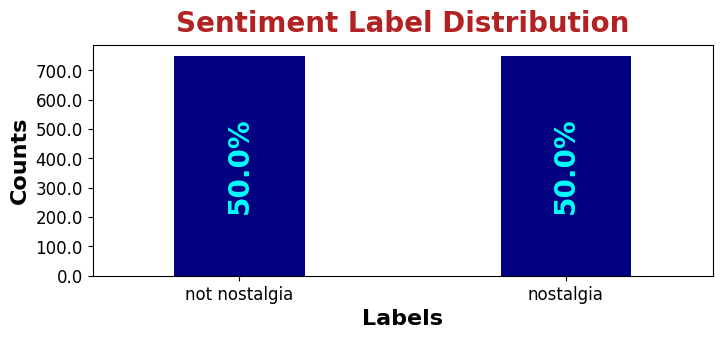

In [5]:
fig          = plt.figure(figsize=(8,3))
ax           = plt.subplot(111)
width        = 0.4

histo        = df.sentiment.value_counts()
# plot barchart for X_sample, see https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.plot.bar.html for example (plot.bar is equal to plot(..., kind="bar"))
bar_plot     = histo.plot(kind = 'bar',
                          ylim = [0, 1.05*histo.max()], 
                          rot = 0, fontsize = 12, ax=ax, position=0.5, width=width, color="navy") # see https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.plot.html#pandas.DataFrame.plot for args adjustment
bar_plot.set_xlabel("Labels", fontsize=16.0, weight="bold")
bar_plot.set_ylabel("Counts", fontsize=16.0, weight="bold")

bar_plot.set_xticklabels(histo.index, fontsize=12.0)
bar_plot.set_yticklabels(bar_plot.get_yticks(), fontsize=12.0)
bar_plot.set_title( 'Sentiment Label Distribution', fontdict={"size":20.0, "weight": "heavy"}, y=1.02, color="Firebrick")

for idx, label in enumerate(histo.index):
    ax.text(x=idx, y=0.5*histo[label], s="%.1f%%"%(100.0*histo[label]/histo.sum()), color="cyan", ha="center", va="center", transform=ax.transData, weight="heavy", rotation=90, fontdict={"size":20.0})

#### Test tokenizing with `nltk` package
* We do not use this property for any analysis, so can be omitted  

In [6]:
df['unigrams'] = df['comment'].apply(lambda text: dmh.tokenize_text(text))

#### Build the complete term frequency/TF-IDF based term-document matrices, without doing any filtering

In [7]:
term_doc_matrix_by_frequency, idx_token_sorted_by_freq,  count_vect = make_term_document_matrix(df, method="frequency", remove_flag_by_df=False, remove_flag_by_sorting=False)
term_doc_matrix_by_tfidf,     idx_token_sorted_by_tfidf, tfidf_vect = make_term_document_matrix(df, method="tf-idf",    remove_flag_by_df=False, remove_flag_by_sorting=False)

#### Heat map for the sampled dataset
* The heat map color-coding used $\log_{2}(\rm{Term\ Count})$; if zero term count is encountered, its color-coding value will be set as `-1`
* The structure of the code is basically the same as that in Exercise 11 in `DM2024-Lab1-Master.ipynb`. Can refer to the code explanation there for further details 

/tmp/ipykernel_553474/844008598.py:15: RuntimeWarning:

divide by zero encountered in log2



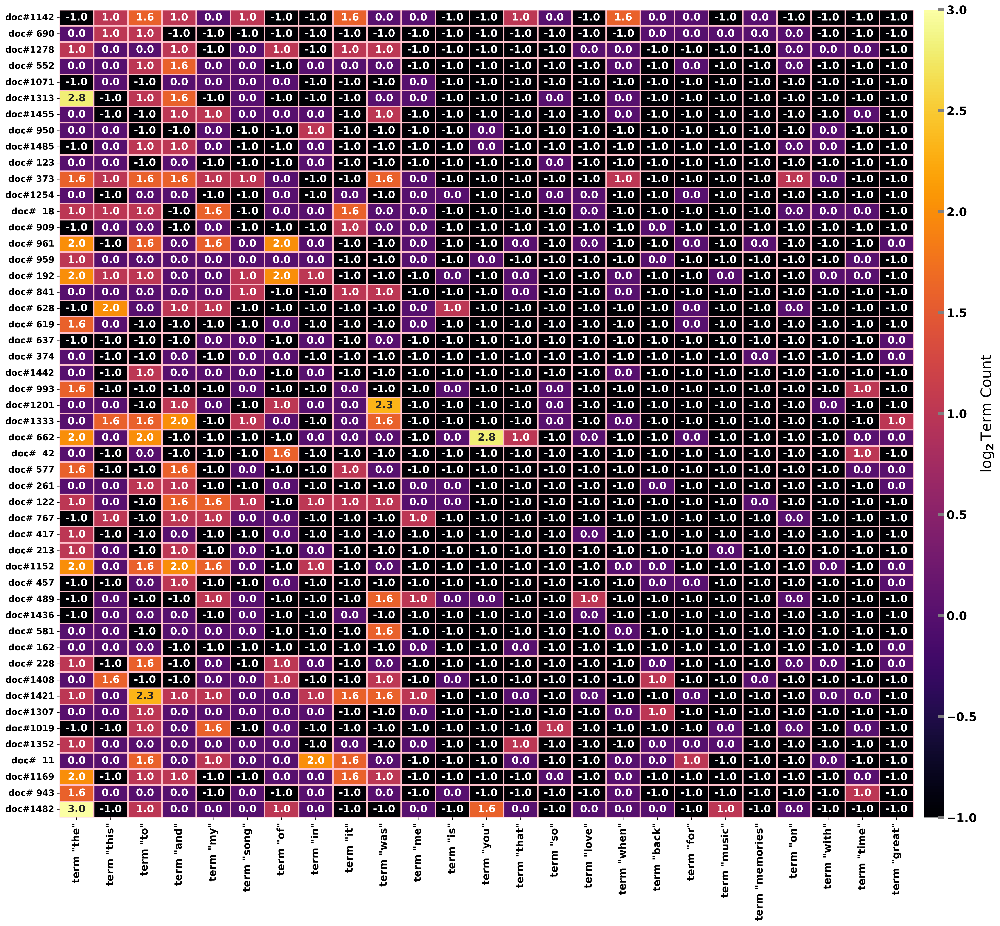

In [8]:
seed              = 123015785
N_word            = 25
N_sample          = 50
cmap_lower_bound  = -1.0
term_sorted       = count_vect.get_feature_names_out()[idx_token_sorted_by_freq]

# compute the total counts for the top N_word frequently-appearing tokens for all the records
idx_token_select  = idx_token_sorted_by_freq[:N_word]
total_counts_word = term_doc_matrix_by_frequency.loc[:,term_sorted[:N_word]].sum(axis=1).values
N_sample          = min(N_sample, (total_counts_word!=0).sum())

df_sample         = df.sample(n=N_sample , random_state=seed, replace=False, weights=pd.Series(total_counts_word)) #set random state as a fixed seed
plot_x            = ["term \""+str(i) for i in term_sorted[:N_word]+"\""]
plot_y            = ["doc#%4s"%(str(i)) for i in list(df_sample.index)]
plot_z            = np.log2((term_doc_matrix_by_frequency.loc[df_sample.index,term_sorted[:N_word]].values))
plot_z[plot_z == -np.inf] = -1.0

df_todraw         = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(25, 20), dpi=320)
ax                = sns.heatmap(df_todraw,
                                cmap="inferno",
                                vmin=cmap_lower_bound, vmax=plot_z.max(), annot=True,
                                linecolor="pink", linewidths=2.0,
                                fmt='.1f', annot_kws={"fontsize": 14.0, "weight":"heavy"},
                                cbar_kws={"aspect":40.0, "pad": 0.01, "ticks":np.arange(cmap_lower_bound, np.ceil(plot_z.max()), 1)}) # see https://seaborn.pydata.org/generated/seaborn.heatmap.html for arg adjustment

ax.set_xticklabels(plot_x, size = 14.0, fontdict={"weight": "heavy"}) # set x, y ticks label; see https://stackoverflow.com/questions/42404154/increase-tick-label-font-size-in-seaborn
ax.set_yticklabels(plot_y, size = 12.0, fontdict={"weight": "heavy"})
cax = ax.figure.axes[-1]
cax.set_yticks(np.arange(cmap_lower_bound, 3.1, 0.5))
cax.set_yticklabels(cax.get_yticklabels(), size = 16.0, fontdict={"weight": "heavy"})
cax.set_ylabel("$\\mathbf{\\log_2{\\mathrm{Term\\ Count}}}$", size = 20.0, fontdict={"weight": "heavy"}) 
cax.tick_params(direction="in", width=4.0, length=8.0, color="gray") # adjust the cbar tick labels; see https://stackoverflow.com/questions/27832054/change-tick-size-on-colorbar-of-seaborn-heatmap

#### Logarithm plot for the sorted term counts
 * The `y` axis is the $\log_{10}(\rm{Term\ Count})$ for each term; here the $\rm{Term\ Count}$ refers to the total frequency of each term after summing over all the `1500` documents
 * The `x` axis is the text of each term, after sorted by $\rm{Term\ Count}$ in descending fashion

In [9]:
idx_vocab       = 200
title           = "Logarithm Term Counts for Sorted Vocabularies"
annotation      = "$\\rm{First\\ %d\\ }^{\\rm{th}}\\rm{\\ Sorted\\ Vocabularies\\ Shown}$"%(idx_vocab)
term_freq       = term_doc_matrix_by_frequency.sum(axis=0)

term_sorted     = count_vect.get_feature_names_out()[idx_token_sorted_by_freq]
log_freq_sorted = np.log10(term_freq[idx_token_sorted_by_freq])

fig             = go.Figure( data=[go.Bar(x=term_sorted[:idx_vocab], y=log_freq_sorted[:idx_vocab],
                                          marker=dict(color=log_freq_sorted[:idx_vocab],         # Use y-values to map color
                                                      colorscale="inferno",                      # Plotly colorscale
                                                      cmin=1.4,                                  # Minimum value for the color scale
                                                      cmax=3.2,                                  # Maximum value for the color scale
                                                      colorbar=dict(
                                                      title=dict( text='Logarithmic Counts',     # Colorbar title
                                                                  side='right'                   # Rotate the label 90 degrees by placing it on the right
                                                      ),
                                                      titlefont=dict(size=16, weight='bold'),    # Font settings for the title (bold)
                                                      tickfont=dict(size=12, weight='bold'),     # Font size for the tick labels on the colorbar
                                                      x=1.0,                                     # Adjust horizontal position (push colorbar further to the right)
                                                      y=0.5,                                     # Adjust vertical position (centered vertically)
                                                      xanchor='left',                            # Anchor the color bar relative to x position
                                                      yanchor='middle',                          # Anchor the color bar relative to y position
                                                      ))
                                          )],
                             layout_title_text=title)

# Adjust layout properties
fig.update_layout( title={ "text":      title,
                           "x":        0.5,                               # Center the title
                           "xanchor": "center",
                           "yanchor": "top",
                           "font":    {"size":    20,
                                       "weight": "bold"}                  # Font size for title
                         },
                   xaxis={ "tickfont":  {"size":   8,
                                         "weight": "bold"},               # Font size for x-axis ticks
                           "title":     "Sorted Vocabularies",            # Label for x-axis
                           "titlefont": {"size": 14,
                                         "weight": "bold"}                # Font properties for x-axis label
                         },
                   yaxis={ "tickfont":  {"size":   10,
                                         "weight": "bold"},               # Font size for y-axis ticks
                           "title":     "Logarithmic Term Counts",        # Label for y-axis
                           "range":     [0, log_freq_sorted.max()*1.05],  # Same as ylim
                           "titlefont": {"size": 14,
                                         "weight": "bold"}                # Font properties for y-axis label
                         },
                   annotations=[ dict( x        =1.00,
                                       y        =1.02,
                                       showarrow=False,
                                       text     =annotation,
                                       xref     ="paper",
                                       yref     ="paper",
                                       xanchor  ="right",
                                       yanchor  ="bottom",
                                       font     =dict(size=12,
                                                      color="red") ) ]
                  )
fig.show(renderer="notebook", port=80512)


/tmp/ipykernel_553474/876235759.py:7: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



#### Heat map for the sampled dataset
* The heat map color-coding used $\log_{2}(\rm{TF-IDF})$; if zero TF-IDF is encountered, its color-coding value will be set as `-1`
* The structure of the code is basically the same as that in Exercise 11 in `DM2024-Lab1-Master.ipynb`. Can refer to the code explanation there for further details

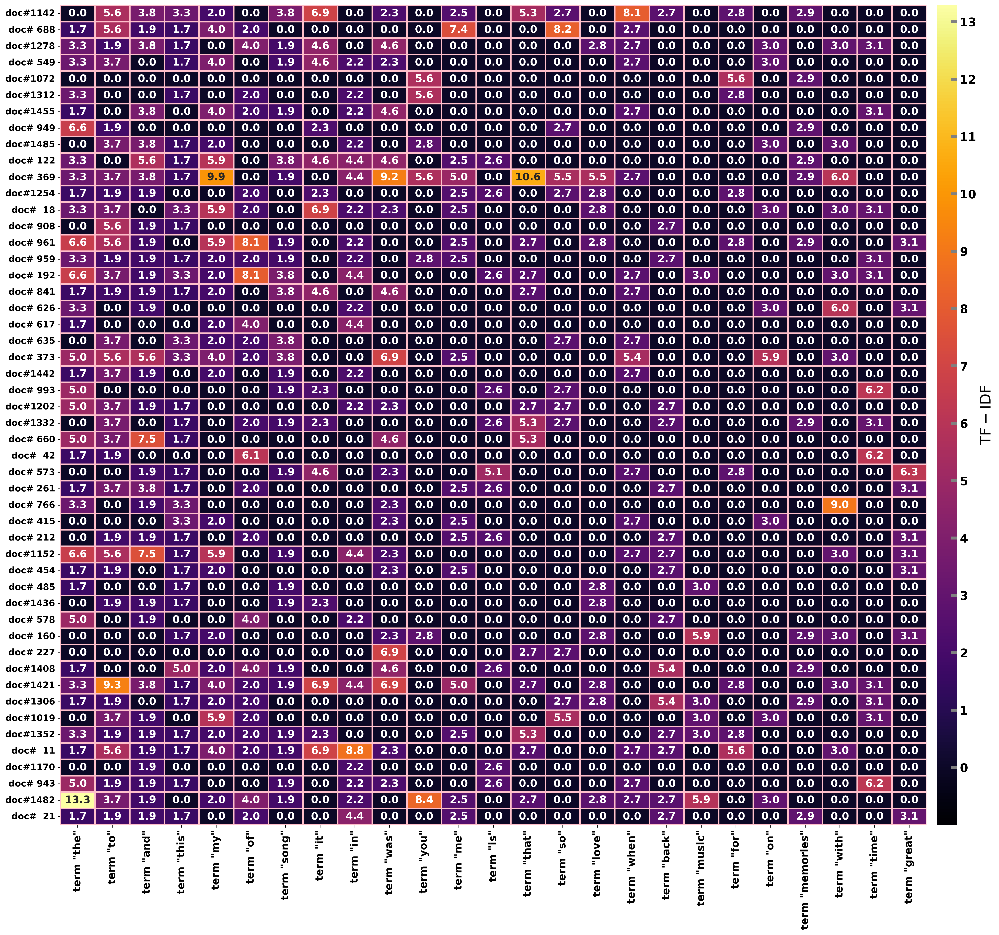

In [10]:
seed              = 123015785
N_word            = 25
N_sample          = 50
term_sorted       = tfidf_vect.get_feature_names_out()[idx_token_sorted_by_tfidf]

# compute the total tf-idf for the top N_word highest tf-idf tokens for all the records
idx_token_select  = idx_token_sorted_by_tfidf[:N_word]
total_tf_idf_word = term_doc_matrix_by_tfidf.loc[:,term_sorted[:N_word]].sum(axis=1).values
N_sample          = min(N_sample, (total_tf_idf_word!=0).sum())

df_sample         = df.sample(n=N_sample , random_state=seed, replace=False, weights=pd.Series(total_tf_idf_word)) #set random state as a fixed seed
plot_x            = ["term \""+str(i) for i in term_sorted[:N_word]+"\""]
plot_y            = ["doc#%4s"%(str(i)) for i in list(df_sample.index)]
plot_z            = term_doc_matrix_by_tfidf.loc[df_sample.index,term_sorted[:N_word]].values
plot_z[plot_z == -np.inf] = -1.0

df_todraw         = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(25, 20), dpi=320)
ax                = sns.heatmap(df_todraw,
                                cmap="inferno",
                                vmin=cmap_lower_bound, vmax=plot_z.max(), annot=True,
                                linecolor="pink", linewidths=2.0,
                                fmt='.1f', annot_kws={"fontsize": 14.0, "weight":"heavy"},
                                cbar_kws={"aspect":40.0, "pad": 0.01, "ticks":np.arange(cmap_lower_bound, np.ceil(plot_z.max()), 1)}) # see https://seaborn.pydata.org/generated/seaborn.heatmap.html for arg adjustment

ax.set_xticklabels(plot_x, size = 14.0, fontdict={"weight": "heavy"}) # set x, y ticks label; see https://stackoverflow.com/questions/42404154/increase-tick-label-font-size-in-seaborn
ax.set_yticklabels(plot_y, size = 12.0, fontdict={"weight": "heavy"})
cax = ax.figure.axes[-1]
cax.set_yticks(np.arange(0.0, 13.1, 1.0))
cax.set_yticklabels(cax.get_yticklabels(), size = 16.0, fontdict={"weight": "heavy"})
cax.set_ylabel("$\\mathbf{\\mathrm{TF-IDF}}$", size = 20.0, fontdict={"weight": "heavy"}) 
cax.tick_params(direction="in", width=4.0, length=8.0, color="gray") # adjust the cbar tick labels; see https://stackoverflow.com/questions/27832054/change-tick-size-on-colorbar-of-seaborn-heatmap

#### Logarithm plot for the sorted term counts
 * The `y` axis is the $\log_{10}(\rm{TF-IDF})$ for each term; here the $\rm{TF-IDF}$ refers to the total TF-IDF value of each term after summing over all the `1500` documents
 * The `x` axis is the text of each term, after sorted by $\rm{TF-IDF}$ in descending fashion

In [11]:
idx_vocab        = 200
title            = "Logarithmic TF-IDF for Sorted Vocabularies"
annotation       = "$\\rm{First\\ %d\\ }^{\\rm{th}}\\rm{\\ Sorted\\ Vocabularies\\ Shown}$"%(idx_vocab)
term_tfidf       = np.log10(term_doc_matrix_by_tfidf.sum(axis=0))

term_sorted      = tfidf_vect.get_feature_names_out()[idx_token_sorted_by_tfidf]
log_tfidf_sorted = term_tfidf[idx_token_sorted_by_tfidf]

fig              = go.Figure( data=[go.Bar(x=term_sorted[:idx_vocab], y=log_tfidf_sorted[:idx_vocab],
                                           marker=dict(color=log_tfidf_sorted[:idx_vocab],        # Use y-values to map color
                                                       colorscale="inferno",                      # Plotly colorscale
                                                     #   cmin=1.4,                                  # Minimum value for the color scale
                                                     #   cmax=3.2,                                  # Maximum value for the color scale
                                                       colorbar=dict(
                                                       title=dict( text='Logarithmic TF-IDF',     # Colorbar title
                                                                   side='right'                   # Rotate the label 90 degrees by placing it on the right
                                                       ),
                                                       titlefont=dict(size=16, weight='bold'),    # Font settings for the title (bold)
                                                       tickfont=dict(size=12, weight='bold'),     # Font size for the tick labels on the colorbar
                                                       x=1.0,                                     # Adjust horizontal position (push colorbar further to the right)
                                                       y=0.5,                                     # Adjust vertical position (centered vertically)
                                                       xanchor='left',                            # Anchor the color bar relative to x position
                                                       yanchor='middle',                          # Anchor the color bar relative to y position
                                                       ))
                                           )],
                              layout_title_text=title)

# Adjust layout properties
fig.update_layout( title={ "text":      title,
                           "x":        0.5,                               # Center the title
                           "xanchor": "center",
                           "yanchor": "top",
                           "font":    {"size":    20,
                                       "weight": "bold"}                  # Font size for title
                         },
                   xaxis={ "tickfont":  {"size":   8,
                                         "weight": "bold"},               # Font size for x-axis ticks
                           "title":     "Sorted Vocabularies",            # Label for x-axis
                           "titlefont": {"size": 14,
                                         "weight": "bold"}                # Font properties for x-axis label
                         },
                   yaxis={ "tickfont":  {"size":   10,
                                         "weight": "bold"},               # Font size for y-axis ticks
                           "title":     "Logarithmic TF-IDF",             # Label for y-axis
                           "range":     [0, log_tfidf_sorted.max()*1.05], # Same as ylim
                           "titlefont": {"size": 14,
                                         "weight": "bold"}                # Font properties for y-axis label
                         },
                   annotations=[ dict( x        =1.00,
                                       y        =1.02,
                                       showarrow=False,
                                       text     =annotation,
                                       xref     ="paper",
                                       yref     ="paper",
                                       xanchor  ="right",
                                       yanchor  ="bottom",
                                       font     =dict(size=12,
                                                      color="red") ) ]
                  )
fig.show(renderer="notebook", port=80513)


/tmp/ipykernel_553474/1129802223.py:7: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



#### Make filtered term-frequency-based term-document matrices
* We construct term-document matrices filtered by document frequency and document frequency + term frequency.
* For each lable `0` and `1`, we construct the corresponding term matrices respectively. This is because these matrices will be further utilized to extract text patterns, and we want to obtain unique patterns for each label.

In [12]:
remove_upper_bound_df_freq      = 0.30 # removed by document frequency (percentage); only remove terms by document frequency when vectorizing
remove_lower_bound_df_freq      = 2e-3 # removed by document frequency (percentage); only remove terms by document frequency when vectorizing
remove_upper_bound_sorting_freq = 0.95 # removed by term frequency/tf-idf (percentage); remove indices by term frequency after sorting by term frequency/tf-idf
remove_lower_bound_sorting_freq = 0.01 # removed by term frequency/tf-idf (percentage); remove indices by term frequency after sorting by term frequency/tf-idf

term_doc_matrix_by_frequency_filtered_by_tf     = {}
idx_token_sorted_by_frequency_filtered_by_tf    = {}
count_vect_fitered_by_tf                        = {}

term_doc_matrix_by_frequency_filtered_by_df_tf  = {}
idx_token_sorted_by_frequency_filtered_by_df_tf = {}
count_vect_fitered_by_df_tf                     = {}

for label in label_list:
    term_doc_matrix_by_frequency_filtered_by_tf[label], idx_token_sorted_by_frequency_filtered_by_tf[label], count_vect_fitered_by_tf[label] = \
    make_term_document_matrix(df[df["sentiment"] == label], method="frequency", remove_flag_by_df=False,  remove_flag_by_sorting=True,
                              remove_upper_bound_tf=remove_upper_bound_sorting_freq, remove_lower_bound_tf=remove_lower_bound_sorting_freq)

    term_doc_matrix_by_frequency_filtered_by_df_tf[label], idx_token_sorted_by_frequency_filtered_by_df_tf[label], count_vect_fitered_by_df_tf[label] = \
        make_term_document_matrix(df[df["sentiment"] == label], method="frequency", remove_flag_by_df=True,   remove_flag_by_sorting=True,\
                                remove_upper_bound_df=remove_upper_bound_df_freq,      remove_lower_bound_df=remove_lower_bound_df_freq,\
                                remove_upper_bound_tf=remove_upper_bound_sorting_freq, remove_lower_bound_tf=remove_lower_bound_sorting_freq)


In [13]:
term_doc_matrix_by_frequency

,00,000,045,07,10,100,10m,11,11th,12,...,yours,yourself,youth,youthful,youtube,yrs,yuo,yup,zealand,zulus
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1496,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1497,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1498,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [14]:
term_doc_matrix_by_frequency_filtered_by_tf["nostalgia"]

,remember,old,with,is,music,great,brings,we,beautiful,as,...,badly,backwards,backseat,backlash,babies,babe,az,awesomeness,aware,awake
0,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,1,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
745,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
746,0,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
747,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
748,0,0,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0


In [15]:
term_doc_matrix_by_frequency_filtered_by_tf["not nostalgia"]

,on,not,be,voice,can,me,just,songs,beautiful,as,...,based,barrymore,baritone,barbiedolly,barbados,banging,banger,ballads,ball,bag
0,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,1,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,2,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
745,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
746,0,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
747,1,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
748,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [16]:
term_doc_matrix_by_frequency_filtered_by_df_tf["nostalgia"]

,you,remember,old,with,is,music,great,brings,we,beautiful,...,captured,bye,buy,build,broken,british,brewer,brand,brain,box
0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,1,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
745,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
746,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
747,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
748,0,0,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0


In [17]:
term_doc_matrix_by_frequency_filtered_by_df_tf["not nostalgia"]

,have,one,like,but,he,with,great,all,what,on,...,couldn,compose,completely,compilation,compare,commented,comfortable,clearly,chorus,choir
0,1,0,0,1,1,1,1,2,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
745,0,1,1,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
746,0,0,0,2,2,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
747,0,0,0,1,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
748,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [18]:
test_idx = -1
count_vect.get_feature_names_out()[test_idx], count_vect_fitered_by_tf["nostalgia"].get_feature_names_out()[test_idx], count_vect_fitered_by_df_tf["nostalgia"].get_feature_names_out()[test_idx],\
                                              count_vect_fitered_by_tf["not nostalgia"].get_feature_names_out()[test_idx], count_vect_fitered_by_df_tf["not nostalgia"].get_feature_names_out()[test_idx], 

('zulus', 'yup', 'yrs', 'zulus', 'youtube')

In [19]:
test_string = "the"
test_string in term_doc_matrix_by_frequency.columns, test_string in term_doc_matrix_by_frequency_filtered_by_tf["nostalgia"].columns, test_string in term_doc_matrix_by_frequency_filtered_by_df_tf["nostalgia"].columns,\
                                                     test_string in term_doc_matrix_by_frequency_filtered_by_tf["not nostalgia"].columns, test_string in term_doc_matrix_by_frequency_filtered_by_df_tf["not nostalgia"].columns

(True, False, False, False, False)

##### Convert the matrices into transaction data and save them

In [20]:
file_1 = {}
file_2 = {}
for label in label_list:
    data_folder_label = "./transcation_database_HW1_%s"%(label)
    if not os.path.exists(data_folder_label):
        os.makedirs(data_folder_label)

    file_1[label] = "%s/transcation_data_by_frequency_filtered_by_tf_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f.csv"%(data_folder_label, remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)
    file_2[label] = "%s/transcation_data_by_frequency_filtered_by_df_tf_remove_upper_bound_df=%.3f_remove_lower_bound_df=%.3f_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f_.csv"%(data_folder_label, remove_upper_bound_df_freq, remove_lower_bound_df_freq, remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)

    obj = DF2DB(term_doc_matrix_by_frequency_filtered_by_tf[label])
    obj.convert2TransactionalDatabase(file_1[label], '>=', 1)

    obj = DF2DB(term_doc_matrix_by_frequency_filtered_by_df_tf[label])
    obj.convert2TransactionalDatabase(file_2[label], '>=', 1)

#### Make filtered TF-IDF-based term-document matrices
* We construct term-document matrices filtered by document frequency and document frequency + TF-IDF.
* The filtered term-document matrices have less term column, so this procedure can be treated as certain dimension reduction if we use them as training data attributes.

In [21]:
# remove_upper_bound_df_tfidf      = 0.30 # removed by document frequency (percentage); only remove terms by document frequency when vectorizing
# remove_lower_bound_df_tfidf      = 2e-3 # removed by document frequency (percentage); only remove terms by document frequency when vectorizing
# remove_upper_bound_sorting_tfidf = 1.00 # removed by term frequency/tf-idf (percentage); remove indices by term frequency after sorting by term frequency/tf-idf
# remove_lower_bound_sorting_tfidf = 0.10 # removed by term frequency/tf-idf (percentage); remove indices by term frequency after sorting by term frequency/tf-idf

remove_upper_bound_df_tfidf      = 0.90 # removed by document frequency (percentage); only remove terms by document frequency when vectorizing
remove_lower_bound_df_tfidf      = 1e-3 # removed by document frequency (percentage); only remove terms by document frequency when vectorizing
remove_upper_bound_sorting_tfidf = 1.00 # removed by term frequency/tf-idf (percentage); remove indices by term frequency after sorting by term frequency/tf-idf
remove_lower_bound_sorting_tfidf = 0.05 # removed by term frequency/tf-idf (percentage); remove indices by term frequency after sorting by term frequency/tf-idf
  
term_doc_matrix_by_tfidf_filtered_by_tfidf, idx_token_sorted_by_tfidf_filtered_by_tfidf, tfidf_vect_fitered_by_tfidf = \
    make_term_document_matrix(df, method="tf-idf", remove_flag_by_df=False,     remove_flag_by_sorting=True,
                                remove_upper_bound_tf=remove_upper_bound_sorting_tfidf, remove_lower_bound_tf=remove_lower_bound_sorting_tfidf)

term_doc_matrix_by_tfidf_filtered_by_df_tfidf, idx_token_sorted_by_tfidf_filtered_by_df_tfidf, tfidf_vect_filtered_by_df_tfidf = \
    make_term_document_matrix(df, method="tf-idf", remove_flag_by_df=True,   remove_flag_by_sorting=True,\
                                remove_upper_bound_df=remove_upper_bound_df_tfidf,      remove_lower_bound_df=remove_lower_bound_df_tfidf,\
                                remove_upper_bound_tf=remove_upper_bound_sorting_tfidf, remove_lower_bound_tf=remove_lower_bound_sorting_tfidf)

In [22]:
term_doc_matrix_by_tfidf

,00,000,045,07,10,100,10m,11,11th,12,...,yours,yourself,youth,youthful,youtube,yrs,yuo,yup,zealand,zulus
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1496,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1497,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1498,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [23]:
term_doc_matrix_by_tfidf_filtered_by_tfidf

,say,name,live,lot,fantastic,before,playing,even,oh,dance,...,1950,1930s,1930,1927,17th,16years,11th,10m,045,00
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,7.62074,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
1496,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
1497,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0
1498,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.912689,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0


In [24]:
term_doc_matrix_by_tfidf_filtered_by_df_tfidf

,those,ever,there,would,loved,by,reminds,more,only,an,...,1981,1979,1974,1969,1968,1962,1958,1952,150,000
0,4.094379,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.000000,3.983153,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,4.109194,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.000000,0.000000,0.000000,0.000000,0.0,0.0,3.970081,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0.000000,0.000000,0.000000,4.037221,0.0,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1496,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1497,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1498,0.000000,0.000000,4.065392,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [25]:
test_idx = -1
tfidf_vect.get_feature_names_out()[test_idx], tfidf_vect_fitered_by_tfidf.get_feature_names_out()[test_idx], tfidf_vect_filtered_by_df_tfidf.get_feature_names_out()[test_idx]

('zulus', 'zulus', 'yrs')

In [26]:
test_string = "the"
test_string in term_doc_matrix_by_tfidf.columns, test_string in term_doc_matrix_by_tfidf_filtered_by_tfidf.columns, test_string in term_doc_matrix_by_tfidf_filtered_by_df_tfidf.columns

(True, False, False)

In [27]:
# data_folder = "./transcation_database_HW1_all_labels"
# if not os.path.exists(data_folder):
#     os.makedirs(data_folder)
    
# file_3 = "%s/transcation_data_by_tfidf_filtered_by_tfidf_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f.csv"%(data_folder, remove_upper_bound_sorting, remove_lower_bound_sorting)
# file_4 = "%s/transcation_data_by_tfidf_filtered_by_df_tfidf_remove_upper_bound_df=%.3f_remove_lower_bound_df=%.3f_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f_.csv"%(data_folder, remove_upper_bound_df, remove_lower_bound_df, remove_upper_bound_sorting, remove_lower_bound_sorting)
    
# obj = DF2DB(term_doc_matrix_by_tfidf_filtered_by_tfidf)
# obj.convert2TransactionalDatabase(file_3, '>=', 0)

# obj = DF2DB(term_doc_matrix_by_tfidf_filtered_by_df_tfidf)
# obj.convert2TransactionalDatabase(file_4, '>=', 0)

#### Show the statistics of the transaction data set

* Filtered by document frequency, `nostalgia`

Database size (total no of transactions) : 750
Number of items : 2159
Minimum Transaction Size : 1
Average Transaction Size : 14.630666666666666
Maximum Transaction Size : 56
Standard Deviation Transaction Size : 10.460127129034118
Variance in Transaction Sizes : 109.56034000890075
Sparsity : 0.9932234058977922


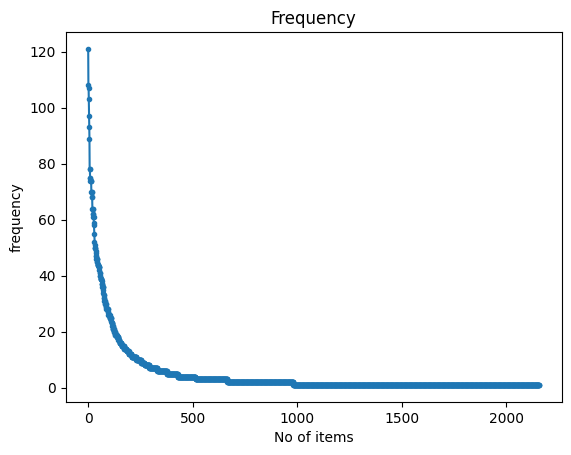

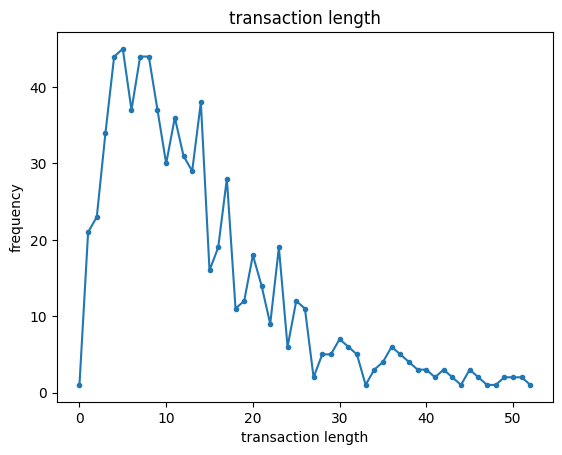

In [28]:
obj = tds.TransactionalDatabase(file_1["nostalgia"])
obj.run()
obj.printStats()
obj.plotGraphs()

* Filtered by document frequency, `not nostalgia`

Database size (total no of transactions) : 750
Number of items : 2446
Minimum Transaction Size : 3
Average Transaction Size : 13.978666666666667
Maximum Transaction Size : 57
Standard Deviation Transaction Size : 8.063221743750379
Variance in Transaction Sizes : 65.10234801958167
Sparsity : 0.9942850913055329


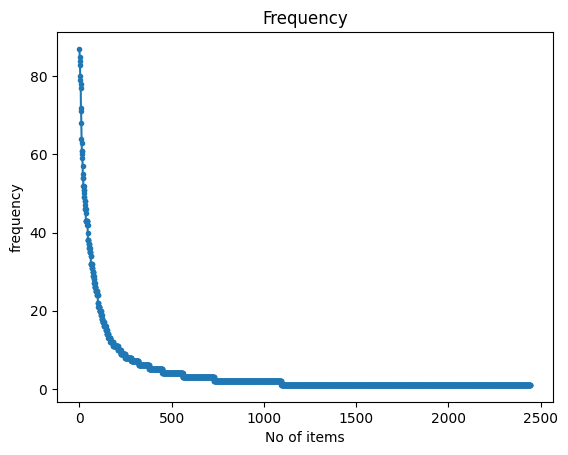

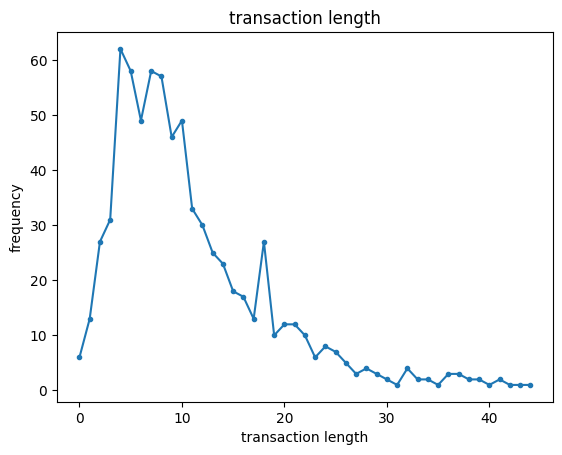

In [29]:
obj = tds.TransactionalDatabase(file_1["not nostalgia"])
obj.run()
obj.printStats()
obj.plotGraphs()

* Filtered by document frequency + term frequency sorting, `nostalgia`

Database size (total no of transactions) : 750
Number of items : 934
Minimum Transaction Size : 1
Average Transaction Size : 13.049333333333333
Maximum Transaction Size : 45
Standard Deviation Transaction Size : 8.799331388741356
Variance in Transaction Sizes : 77.53160836671117
Sparsity : 0.986028551034975


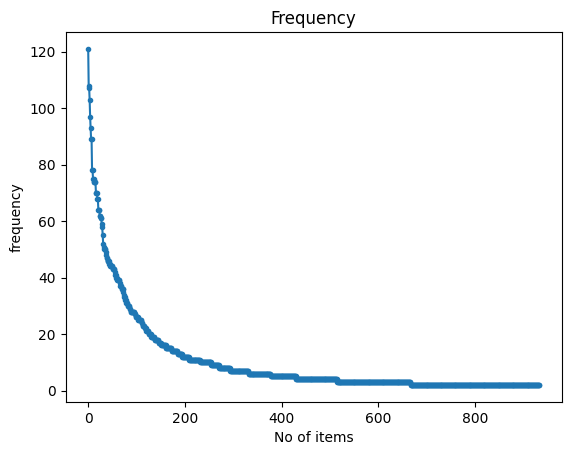

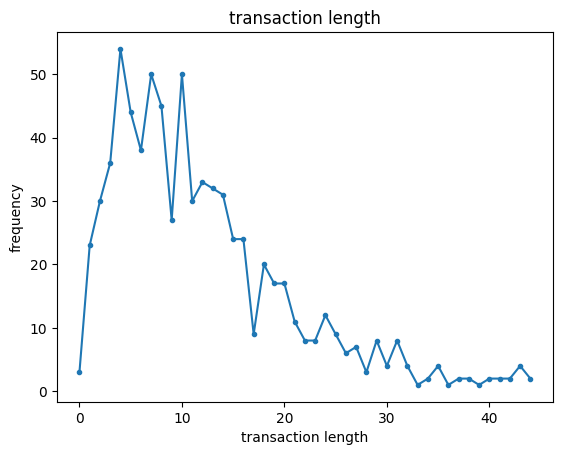

In [30]:
obj = tds.TransactionalDatabase(file_2["nostalgia"])
obj.run()
obj.printStats()
obj.plotGraphs()

* Filtered by document frequency + term frequency sorting, `not nostalgia`

Database size (total no of transactions) : 750
Number of items : 1049
Minimum Transaction Size : 1
Average Transaction Size : 13.145333333333333
Maximum Transaction Size : 53
Standard Deviation Transaction Size : 7.24570297180029
Variance in Transaction Sizes : 52.570305295950156
Sparsity : 0.9874687003495393


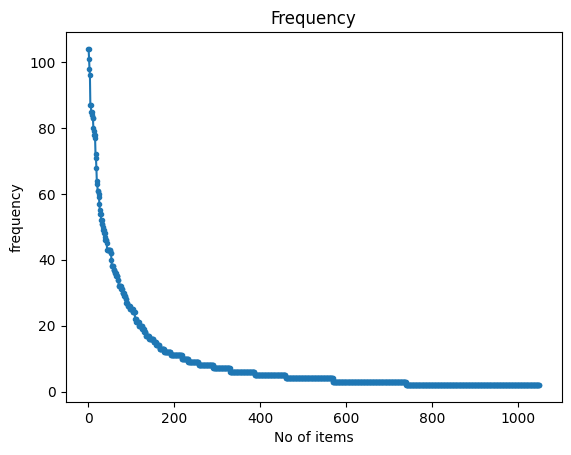

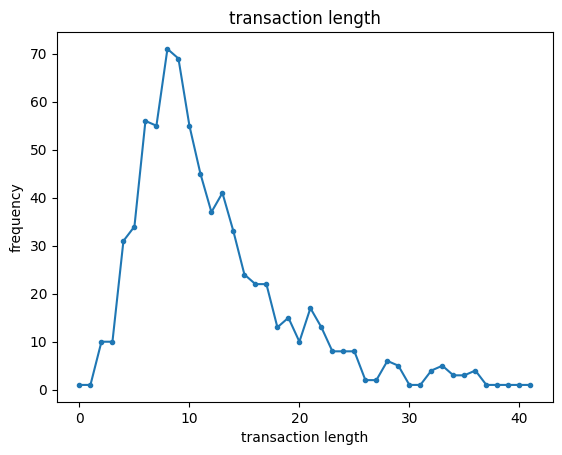

In [31]:
obj = tds.TransactionalDatabase(file_2["not nostalgia"])
obj.run()
obj.printStats()
obj.plotGraphs()

#### Find patterns by FPGrowth

In [32]:
MS_list        = np.linspace(3,12,4)
for label in label_list:
    data_folder_label = "./transcation_database_HW1_%s"%(label)
    # iFile          = file_1[label]
    # suffix         = "filtered_by_tf_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)

    iFile          = file_2[label]
    suffix         = "filtered_by_df_tf_remove_upper_bound_df=%.3f_remove_lower_bound_df=%.3f_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_df_freq, remove_lower_bound_df_freq, remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)

    for MS in MS_list:
        print("Minimum support = %d"%(MS))
        oFile                            = "%s/frequency_patterns_FPGrowth_MinSup=%d_%s.txt"%(data_folder_label, MS, suffix)
        obj                              = FPGrowth.FPGrowth(iFile=iFile, minSup=MS)
        obj.mine()
        obj.save(oFile)
        frequentPatternsDF_MaxFPGrowth   = obj.getPatternsAsDataFrame().sort_values(by="Support", ascending=False)
        print('Total No of patterns: ' + str(len(frequentPatternsDF_MaxFPGrowth))) #print the total number of patterns
        print('Runtime: ' + str(obj.getRuntime())) #measure the runtime
        print("-------------------------------------------------------------------------------------------")

Minimum support = 3
Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 14317
Runtime: 0.10165524482727051
-------------------------------------------------------------------------------------------
Minimum support = 6
Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 2085
Runtime: 0.19176673889160156
-------------------------------------------------------------------------------------------
Minimum support = 9
Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 790
Runtime: 0.02193474769592285
-------------------------------------------------------------------------------------------
Minimum support = 12
Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 399
Runtime: 0.014693975448608398
-----------------------------------------------------------------------------------

#### Find patterns by FAE Top-K

In [33]:
K_list         = np.linspace(200, 800, 4)

for label in label_list:
    data_folder_label = "./transcation_database_HW1_%s"%(label)
    iFile             = file_1[label]
    suffix            = "filtered_by_tf_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)
    
    # iFile          = file_2[label]
    # suffix         = "filtered_by_df_tf_remove_upper_bound_df=%.3f_remove_lower_bound_df=%.3f_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_df_freq, remove_lower_bound_df_freq, remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)

    for K in K_list:
        print("K = %4d"%(K))
        oFile                            = "%s/frequency_patterns_FAE_topK_K=%d_%s.txt"%(data_folder_label, K, suffix)
        obj                              = FAE.FAE(iFile=iFile, k=K)
        obj.mine()
        obj.save(oFile)
        frequentPatternsDF_FAE_topK = obj.getPatternsAsDataFrame().sort_values(by="Support", ascending=False)
        print('Total No of patterns: ' + str(len(frequentPatternsDF_FAE_topK))) #print the total number of patterns
        print('Runtime: ' + str(obj.getRuntime())) #measure the runtime
        print("-------------------------------------------------------------------------------------------")

K =  200
 TopK frequent patterns were successfully generated using FAE algorithm.
Total No of patterns: 200
Runtime: 0.02438831329345703
-------------------------------------------------------------------------------------------
K =  400
 TopK frequent patterns were successfully generated using FAE algorithm.
Total No of patterns: 400
Runtime: 0.06696867942810059
-------------------------------------------------------------------------------------------
K =  600
 TopK frequent patterns were successfully generated using FAE algorithm.
Total No of patterns: 600
Runtime: 0.14467072486877441
-------------------------------------------------------------------------------------------
K =  800
 TopK frequent patterns were successfully generated using FAE algorithm.
Total No of patterns: 800
Runtime: 0.35653018951416016
-------------------------------------------------------------------------------------------
K =  200
 TopK frequent patterns were successfully generated using FAE algorithm.
To

#### Find patterns by MaxFPGrowth

In [34]:
MS_list        = np.linspace(3,12,4)
for label in label_list:
    data_folder_label = "./transcation_database_HW1_%s"%(label)
    iFile          = file_1[label]
    suffix         = "filtered_by_tf_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)

    # iFile          = file_2[label]
    # suffix         = "filtered_by_df_tf_remove_upper_bound_df=%.3f_remove_lower_bound_df=%.3f_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_df_freq, remove_lower_bound_df_freq, remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)

    for MS in MS_list:
        print("Minimum support = %d"%(MS))
        oFile                            = "%s/frequency_patterns_MaxFPG_MinSup=%d_%s.txt"%(data_folder_label, MS, suffix)
        obj                              = MaxFPGrowth.MaxFPGrowth(iFile=iFile, minSup=MS)
        obj.mine()
        obj.save(oFile)
        frequentPatternsDF_MaxFPGrowth   = obj.getPatternsAsDataFrame().sort_values(by="Support", ascending=False)
        print('Total No of patterns: ' + str(len(frequentPatternsDF_MaxFPGrowth))) #print the total number of patterns
        print('Runtime: ' + str(obj.getRuntime())) #measure the runtime
        print("-------------------------------------------------------------------------------------------")

Minimum support = 3
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 6715
Runtime: 0.13405966758728027
-------------------------------------------------------------------------------------------
Minimum support = 6
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 1643
Runtime: 0.1944875717163086
-------------------------------------------------------------------------------------------
Minimum support = 9
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 641
Runtime: 0.019231319427490234
-------------------------------------------------------------------------------------------
Minimum support = 12
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 308
Runtime: 0.013184785842895508
------------------------------------------------------------------------------------

#### Use patterns found by **FPGrowth** to do prediction on **frequency-based** term-document matrix 

In [80]:
# Tokenize the sentences into sets of unique words
MS                                         = 3
suffix                                     = "filtered_by_tf_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)
# suffix                                     = "filtered_by_df_tf_remove_upper_bound_df=%.3f_remove_lower_bound_df=%.3f_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_df_freq, remove_lower_bound_df_freq, remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)
df["tokenized_comment"]                    = df["comment"].str.split().apply(set)
frequentPatternsDF_FPGrowth             = {}

for label in label_list:
    data_folder_label                      = "./transcation_database_HW1_%s"%(label)
    frequentPatternsDF_FPGrowth[label]  = pd.read_csv("%s/frequency_patterns_FPGrowth_MinSup=%d_%s.txt"%(data_folder_label, MS, suffix), delimiter=":", header=None, names=["Patterns", "Support"])
    frequentPatternsDF_FPGrowth[label]["Patterns"] = frequentPatternsDF_FPGrowth[label]["Patterns"].apply(lambda text: text.replace("\t", " "))
    
# Initialize the pattern matrix
final_pattern_df                           = pd.concat((frequentPatternsDF_FPGrowth["nostalgia"].set_index(["Patterns"]),\
                                                        frequentPatternsDF_FPGrowth["not nostalgia"].set_index(["Patterns"])), ignore_index=True, axis=1).fillna(0).astype(int)
final_pattern_df.columns                   = label_list
unique_filter                              = (final_pattern_df["nostalgia"] == 0) | (final_pattern_df["not nostalgia"] == 0) 
pattern_matrix                             = pd.DataFrame(0, index=df.index, columns=final_pattern_df.index[unique_filter])
tdm_df                                     = term_doc_matrix_by_frequency
# Create a mapping from numerical labels to category names
category_mapping                           = dict(df[["label", "sentiment"]].drop_duplicates().values)
# Convert the numerical category labels to text labels
target_names                               = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df.index[unique_filter].values:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = df["tokenized_comment"].apply(lambda x: 1 if pattern_words.issubset(x) else 0)


# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)
augmented_df

,00,000,045,07,10,100,10m,11,11th,12,...,voice not,voice can,me,me on,me not,me can,on,on not,on can,can not
0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1496,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1497,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1498,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [81]:
# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df, df["label"], test_size=0.3, random_state=seed)

# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.9088888888888889

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.9053    0.9244    0.9148       238
    nostalgia     0.9130    0.8915    0.9021       212

     accuracy                         0.9089       450
    macro avg     0.9092    0.9079    0.9085       450
 weighted avg     0.9090    0.9089    0.9088       450



In [82]:
cross_val_score(nb_classifier, augmented_df, df["label"], cv=10,scoring="accuracy").mean()

np.float64(0.8973333333333333)

#### Use patterns found by **FAE-TopK** to do prediction on **frequency-based** term-document matrix 

In [38]:
# Tokenize the sentences into sets of unique words
K                                       = 800
suffix                                  = "filtered_by_tf_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)
# suffix                                  = "filtered_by_df_tf_remove_upper_bound_df=%.3f_remove_lower_bound_df=%.3f_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_df_freq, remove_lower_bound_df_freq, remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)
df["tokenized_comment"]                 = df["comment"].str.split().apply(set)
frequentPatternsDF_FAE_topK             = {}

for label in label_list:
    data_folder_label = "./transcation_database_HW1_%s"%(label)
    frequentPatternsDF_FAE_topK[label]             = pd.read_csv("%s/frequency_patterns_FAE_topK_K=%d_%s.txt"%(data_folder_label, K, suffix), delimiter=":", header=None, names=["Patterns", "Support"])
    frequentPatternsDF_FAE_topK[label]["Patterns"] = frequentPatternsDF_FAE_topK[label]["Patterns"].apply(lambda text: text.replace("\t", " "))

# Initialize the pattern matrix
final_pattern_df                        = pd.concat((frequentPatternsDF_FAE_topK["nostalgia"].set_index(["Patterns"]),\
                                                     frequentPatternsDF_FAE_topK["not nostalgia"].set_index(["Patterns"])), ignore_index=True, axis=1).fillna(0).astype(int)
final_pattern_df.columns                = label_list
unique_filter                           = (final_pattern_df["nostalgia"] == 0) | (final_pattern_df["not nostalgia"] == 0) 
pattern_matrix                          = pd.DataFrame(0, index=df.index, columns=final_pattern_df.index[unique_filter])
tdm_df                                  = term_doc_matrix_by_frequency
# Create a mapping from numerical labels to category names
category_mapping                        = dict(df[["label", "sentiment"]].drop_duplicates().values)
# Convert the numerical category labels to text labels
target_names                            = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df.index[unique_filter].values:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = df["tokenized_comment"].apply(lambda x: 1 if pattern_words.issubset(x) else 0)


# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)
augmented_df

,00,000,045,07,10,100,10m,11,11th,12,...,when such,when sing,when go,will from,will are,will his,will think,will still,will singer,will here
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1496,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
1497,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1498,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [39]:
# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df, df["label"], test_size=0.3, random_state=seed)

# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8955555555555555

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.9361    0.8613    0.8972       238
    nostalgia     0.8571    0.9340    0.8939       212

     accuracy                         0.8956       450
    macro avg     0.8966    0.8977    0.8955       450
 weighted avg     0.8989    0.8956    0.8956       450



In [40]:
cross_val_score(nb_classifier, augmented_df, df["label"], cv=10,scoring="accuracy").mean()

np.float64(0.8886666666666667)

#### Use patterns found by **MaxFPGrowth** to do prediction on **frequency-based** term-document matrix 

In [41]:
# Tokenize the sentences into sets of unique words
MS                                         = 3
suffix                                     = "filtered_by_tf_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)
# suffix                                     = "filtered_by_df_tf_remove_upper_bound_df=%.3f_remove_lower_bound_df=%.3f_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_df_freq, remove_lower_bound_df_freq, remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)
df["tokenized_comment"]                    = df["comment"].str.split().apply(set)
frequentPatternsDF_MaxFPGrowth             = {}

for label in label_list:
    data_folder_label                      = "./transcation_database_HW1_%s"%(label)
    frequentPatternsDF_MaxFPGrowth[label]  = pd.read_csv("%s/frequency_patterns_MaxFPG_MinSup=%d_%s.txt"%(data_folder_label, MS, suffix), delimiter=":", header=None, names=["Patterns", "Support"])
    frequentPatternsDF_MaxFPGrowth[label]["Patterns"] = frequentPatternsDF_MaxFPGrowth[label]["Patterns"].apply(lambda text: text.replace("\t", " "))
    
# Initialize the pattern matrix
final_pattern_df                           = pd.concat((frequentPatternsDF_MaxFPGrowth["nostalgia"].set_index(["Patterns"]),\
                                                        frequentPatternsDF_MaxFPGrowth["not nostalgia"].set_index(["Patterns"])), ignore_index=True, axis=1).fillna(0).astype(int)
final_pattern_df.columns                   = label_list
unique_filter                              = (final_pattern_df["nostalgia"] == 0) | (final_pattern_df["not nostalgia"] == 0) 
pattern_matrix                             = pd.DataFrame(0, index=df.index, columns=final_pattern_df.index[unique_filter])
tdm_df                                     = term_doc_matrix_by_frequency
# Create a mapping from numerical labels to category names
category_mapping                           = dict(df[["label", "sentiment"]].drop_duplicates().values)
# Convert the numerical category labels to text labels
target_names                               = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df.index[unique_filter].values:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = df["tokenized_comment"].apply(lambda x: 1 if pattern_words.issubset(x) else 0)


# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)
augmented_df

,00,000,045,07,10,100,10m,11,11th,12,...,voice time,just time,voice just,beautiful just,on me just,me be just,can be just,can me just,not beautiful,on voice beautiful
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1496,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1497,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1498,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [42]:
# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df, df["label"], test_size=0.3, random_state=seed)

# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.9133333333333333

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.9307    0.9034    0.9168       238
    nostalgia     0.8950    0.9245    0.9095       212

     accuracy                         0.9133       450
    macro avg     0.9129    0.9139    0.9132       450
 weighted avg     0.9139    0.9133    0.9134       450



In [43]:
cross_val_score(nb_classifier, augmented_df, df["label"], cv=10,scoring="accuracy").mean()

np.float64(0.8913333333333334)

#### Use patterns found by **FPGrowth** to do prediction on **TF-IDF-based** term-document matrix 

In [111]:
MS                                         = 3
suffix                                     = "filtered_by_tf_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)
# suffix                                     = "filtered_by_df_tf_remove_upper_bound_df=%.3f_remove_lower_bound_df=%.3f_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_df_freq, remove_lower_bound_df_freq, remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)
df["tokenized_comment"]                    = df["comment"].str.split().apply(set)
frequentPatternsDF_MaxFPGrowth             = {}

for label in label_list:
    data_folder_label                      = "./transcation_database_HW1_%s"%(label)
    frequentPatternsDF_FPGrowth[label]  = pd.read_csv("%s/frequency_patterns_FPGrowth_MinSup=%d_%s.txt"%(data_folder_label, MS, suffix), delimiter=":", header=None, names=["Patterns", "Support"])
    frequentPatternsDF_FPGrowth[label]["Patterns"] = frequentPatternsDF_FPGrowth[label]["Patterns"].apply(lambda text: text.replace("\t", " "))

# Initialize the pattern matrix
final_pattern_df                           = pd.concat((frequentPatternsDF_FPGrowth["nostalgia"].set_index(["Patterns"]),\
                                                        frequentPatternsDF_FPGrowth["not nostalgia"].set_index(["Patterns"])), ignore_index=True, axis=1).fillna(0).astype(int)
final_pattern_df.columns                   = label_list
unique_filter                              = (final_pattern_df["nostalgia"] == 0) | (final_pattern_df["not nostalgia"] == 0) 
pattern_matrix                             = pd.DataFrame(0, index=df.index, columns=final_pattern_df.index[unique_filter])
tdm_df                                     = term_doc_matrix_by_tfidf
# Do L2 normlization 
normalization                              = np.sqrt((tdm_df**2.0).sum(axis=1)+1e-34)
tdm_df                                     = tdm_df.div(normalization, axis=0)

# Create a mapping from numerical labels to category names
category_mapping                           = dict(df[["label", "sentiment"]].drop_duplicates().values)
# Convert the numerical category labels to text labels
target_names                               = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df.index[unique_filter].values:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = df["tokenized_comment"].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Do L2 normlization 
# normalization                              = np.sqrt((pattern_matrix**2.0).sum(axis=1)+1e-34)
# pattern_matrix                             = pattern_matrix.div(normalization, axis=0)

# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)
augmented_df

,00,000,045,07,10,100,10m,11,11th,12,...,voice not,voice can,me,me on,me not,me can,on,on not,on can,can not
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,0,0,0,0,0,0,0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,1,0,0,0
1496,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1497,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1498,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [112]:
# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df, df["label"], test_size=0.3, random_state=seed)

# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8844444444444445

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.8875    0.8950    0.8912       238
    nostalgia     0.8810    0.8726    0.8768       212

     accuracy                         0.8844       450
    macro avg     0.8842    0.8838    0.8840       450
 weighted avg     0.8844    0.8844    0.8844       450



In [113]:
cross_val_score(nb_classifier, augmented_df, df["label"], cv=10,scoring="accuracy").mean()

np.float64(0.882)

#### Use patterns found by **FPGrowth** to do prediction on **TF-IDF-based** term-document matrix, with **PCA applied**

In [114]:
tdm_df_pca         = PCA(n_components=9).fit_transform(tdm_df)
pattern_matrix_pca = PCA(n_components=0).fit_transform(pattern_matrix)
augmented_df_pca   = np.concatenate((tdm_df_pca,pattern_matrix_pca), axis=1 )

# tdm_df_pca         = umap.UMAP(n_components=10).fit_transform(tdm_df)
# pattern_matrix_pca = umap.UMAP(n_components=1).fit_transform(pattern_matrix)
# augmented_df_pca   = np.concatenate((tdm_df_pca,pattern_matrix_pca), axis=1 )

In [115]:
# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df, df["label"], test_size=0.3, random_state=seed)

# Train the Naive Bayes classifier
nb_classifier = GaussianNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8022222222222222

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.8901    0.7143    0.7925       238
    nostalgia     0.7375    0.9009    0.8110       212

     accuracy                         0.8022       450
    macro avg     0.8138    0.8076    0.8018       450
 weighted avg     0.8182    0.8022    0.8013       450



In [116]:
cross_val_score(nb_classifier, augmented_df, df["label"], cv=10,scoring="accuracy").mean()

np.float64(0.7953333333333334)

In [117]:
# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df_pca, df["label"], test_size=0.3, random_state=seed)

# Train the Naive Bayes classifier
nb_classifier = GaussianNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8511111111111112

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.8327    0.8992    0.8646       238
    nostalgia     0.8756    0.7972    0.8346       212

     accuracy                         0.8511       450
    macro avg     0.8542    0.8482    0.8496       450
 weighted avg     0.8529    0.8511    0.8505       450



In [118]:
cross_val_score(nb_classifier, augmented_df_pca, df["label"], cv=10,scoring="accuracy").mean()

np.float64(0.812)

#### Use patterns found by **FAE-TopK** to do prediction on **TF-IDF-based** term-document matrix 

In [52]:
K                                       = 800
suffix                                  = "filtered_by_tf_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)
# suffix                                  = "filtered_by_df_tf_remove_upper_bound_df=%.3f_remove_lower_bound_df=%.3f_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_df_freq, remove_lower_bound_df_freq, remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)
df["tokenized_comment"]                 = df["comment"].str.split().apply(set)
frequentPatternsDF_FAE_topK             = {}

for label in label_list:
    data_folder_label = "./transcation_database_HW1_%s"%(label)
    frequentPatternsDF_FAE_topK[label]             = pd.read_csv("%s/frequency_patterns_FAE_topK_K=%d_%s.txt"%(data_folder_label, K, suffix), delimiter=":", header=None, names=["Patterns", "Support"])
    frequentPatternsDF_FAE_topK[label]["Patterns"] = frequentPatternsDF_FAE_topK[label]["Patterns"].apply(lambda text: text.replace("\t", " "))

# Initialize the pattern matrix
final_pattern_df                        = pd.concat((frequentPatternsDF_FAE_topK["nostalgia"].set_index(["Patterns"]),\
                                                     frequentPatternsDF_FAE_topK["not nostalgia"].set_index(["Patterns"])), ignore_index=True, axis=1).fillna(0).astype(int)
final_pattern_df.columns                = label_list
unique_filter                           = (final_pattern_df["nostalgia"] == 0) | (final_pattern_df["not nostalgia"] == 0) 
pattern_matrix                          = pd.DataFrame(0, index=df.index, columns=final_pattern_df.index[unique_filter])
tdm_df                                  = term_doc_matrix_by_tfidf
# Do L2 normlization 
normalization                           = np.sqrt((tdm_df**2.0).sum(axis=1)+1e-34)
tdm_df                                  = tdm_df.div(normalization, axis=0)

# Create a mapping from numerical labels to category names
category_mapping                        = dict(df[["label", "sentiment"]].drop_duplicates().values)
# Convert the numerical category labels to text labels
target_names                            = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df.index[unique_filter].values:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = df["tokenized_comment"].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Do L2 normlization 
# normalization                              = np.sqrt((pattern_matrix**2.0).sum(axis=1)+1e-34)
# pattern_matrix                             = pattern_matrix.div(normalization, axis=0)

# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)
augmented_df

,00,000,045,07,10,100,10m,11,11th,12,...,when such,when sing,when go,will from,will are,will his,will think,will still,will singer,will here
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1496,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1,0,0,0,0,0,0,0,0,0
1497,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1498,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [53]:
# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df, df["label"], test_size=0.3, random_state=seed)

# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8533333333333334

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.9216    0.7899    0.8507       238
    nostalgia     0.7967    0.9245    0.8559       212

     accuracy                         0.8533       450
    macro avg     0.8592    0.8572    0.8533       450
 weighted avg     0.8628    0.8533    0.8531       450



In [54]:
cross_val_score(nb_classifier, augmented_df, df["label"], cv=10,scoring="accuracy").mean()

np.float64(0.8633333333333333)

#### Use patterns found by **FAE-TopK** to do prediction on **TF-IDF-based** term-document matrix, with **PCA applied**

In [55]:
tdm_df_pca         = PCA(n_components=9).fit_transform(tdm_df)
pattern_matrix_pca = PCA(n_components=0).fit_transform(pattern_matrix)
augmented_df_pca   = np.concatenate((tdm_df_pca,pattern_matrix_pca), axis=1 )

# tdm_df_pca         = umap.UMAP(n_components=100).fit_transform(tdm_df)
# pattern_matrix_pca = umap.UMAP(n_components=8).fit_transform(pattern_matrix)
# augmented_df_pca   = np.concatenate((tdm_df_pca,pattern_matrix_pca), axis=1 )

In [56]:
# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df, df["label"], test_size=0.3, random_state=seed)
# X_train, X_test, y_train, y_test = train_test_split(tdm_df, df["label"], test_size=0.3, random_state=seed)

# Train the Naive Bayes classifier
nb_classifier = GaussianNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.7644444444444445

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.8438    0.6807    0.7535       238
    nostalgia     0.7054    0.8585    0.7745       212

     accuracy                         0.7644       450
    macro avg     0.7746    0.7696    0.7640       450
 weighted avg     0.7786    0.7644    0.7634       450



In [57]:
cross_val_score(nb_classifier, augmented_df, df["label"], cv=10, scoring="accuracy").mean()

np.float64(0.756)

In [58]:
# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df_pca, df["label"], test_size=0.3, random_state=seed)

# Train the Naive Bayes classifier
nb_classifier = GaussianNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8555555555555555

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.8366    0.9034    0.8687       238
    nostalgia     0.8808    0.8019    0.8395       212

     accuracy                         0.8556       450
    macro avg     0.8587    0.8526    0.8541       450
 weighted avg     0.8574    0.8556    0.8549       450



In [59]:
cross_val_score(nb_classifier, augmented_df_pca, df["label"], cv=10,scoring="accuracy").mean()

np.float64(0.8133333333333332)

#### Use patterns found by **MaxGrowth** to do prediction on **TF-IDF-based** term-document matrix 

In [119]:
MS                                         = 3
suffix                                     = "filtered_by_tf_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)
# suffix                                     = "filtered_by_df_tf_remove_upper_bound_df=%.3f_remove_lower_bound_df=%.3f_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_df_freq, remove_lower_bound_df_freq, remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)
df["tokenized_comment"]                    = df["comment"].str.split().apply(set)
frequentPatternsDF_MaxFPGrowth             = {}

for label in label_list:
    data_folder_label                      = "./transcation_database_HW1_%s"%(label)
    frequentPatternsDF_MaxFPGrowth[label]  = pd.read_csv("%s/frequency_patterns_MaxFPG_MinSup=%d_%s.txt"%(data_folder_label, MS, suffix), delimiter=":", header=None, names=["Patterns", "Support"])
    frequentPatternsDF_MaxFPGrowth[label]["Patterns"] = frequentPatternsDF_MaxFPGrowth[label]["Patterns"].apply(lambda text: text.replace("\t", " "))

# Initialize the pattern matrix
final_pattern_df                           = pd.concat((frequentPatternsDF_MaxFPGrowth["nostalgia"].set_index(["Patterns"]),\
                                                        frequentPatternsDF_MaxFPGrowth["not nostalgia"].set_index(["Patterns"])), ignore_index=True, axis=1).fillna(0).astype(int)
final_pattern_df.columns                   = label_list
unique_filter                              = (final_pattern_df["nostalgia"] == 0) | (final_pattern_df["not nostalgia"] == 0) 
pattern_matrix                             = pd.DataFrame(0, index=df.index, columns=final_pattern_df.index[unique_filter])
tdm_df                                     = term_doc_matrix_by_tfidf
# Do L2 normlization 
normalization                              = np.sqrt((tdm_df**2.0).sum(axis=1)+1e-34)
tdm_df                                     = tdm_df.div(normalization, axis=0)

# Create a mapping from numerical labels to category names
category_mapping                           = dict(df[["label", "sentiment"]].drop_duplicates().values)
# Convert the numerical category labels to text labels
target_names                               = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df.index[unique_filter].values:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = df["tokenized_comment"].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Do L2 normlization 
# normalization                              = np.sqrt((pattern_matrix**2.0).sum(axis=1)+1e-34)
# pattern_matrix                             = pattern_matrix.div(normalization, axis=0)

# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)
augmented_df

,00,000,045,07,10,100,10m,11,11th,12,...,voice time,just time,voice just,beautiful just,on me just,me be just,can be just,can me just,not beautiful,on voice beautiful
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1496,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1497,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1498,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [120]:
# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df, df["label"], test_size=0.3, random_state=seed)

# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8688888888888889

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.8943    0.8529    0.8731       238
    nostalgia     0.8430    0.8868    0.8644       212

     accuracy                         0.8689       450
    macro avg     0.8687    0.8699    0.8687       450
 weighted avg     0.8701    0.8689    0.8690       450



In [121]:
cross_val_score(nb_classifier, augmented_df, df["label"], cv=10,scoring="accuracy").mean()

np.float64(0.8646666666666667)

#### Use patterns found by **MaxGrowth** to do prediction on **TF-IDF-based** term-document matrix, with **PCA applied**

In [127]:
tdm_df_pca         = PCA(n_components=9).fit_transform(tdm_df)
pattern_matrix_pca = PCA(n_components=0).fit_transform(pattern_matrix)
augmented_df_pca   = np.concatenate((tdm_df_pca,pattern_matrix_pca), axis=1 )

# tdm_df_pca         = umap.UMAP(n_components=10).fit_transform(tdm_df)
# pattern_matrix_pca = umap.UMAP(n_components=1).fit_transform(pattern_matrix)
# augmented_df_pca   = np.concatenate((tdm_df_pca,pattern_matrix_pca), axis=1 )

In [128]:
# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df, df["label"], test_size=0.3, random_state=seed)

# Train the Naive Bayes classifier
nb_classifier = GaussianNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.7844444444444445

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.8310    0.7437    0.7849       238
    nostalgia     0.7426    0.8302    0.7840       212

     accuracy                         0.7844       450
    macro avg     0.7868    0.7869    0.7844       450
 weighted avg     0.7894    0.7844    0.7845       450



In [129]:
cross_val_score(nb_classifier, augmented_df, df["label"], cv=10,scoring="accuracy").mean()

np.float64(0.8073333333333332)

In [130]:
# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df_pca, df["label"], test_size=0.3, random_state=seed)

# Train the Naive Bayes classifier
nb_classifier = GaussianNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8533333333333334

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.8333    0.9034    0.8669       238
    nostalgia     0.8802    0.7972    0.8366       212

     accuracy                         0.8533       450
    macro avg     0.8568    0.8503    0.8518       450
 weighted avg     0.8554    0.8533    0.8527       450



In [131]:
cross_val_score(nb_classifier, augmented_df_pca, df["label"], cv=10,scoring="accuracy").mean()

np.float64(0.8160000000000001)

#### Summary of accuracy metrics for all methods

| Term-Document Type | Pattern Finding | with PCA | Feature Dimension |  Naive Bayes classifier Type | Accuracy over Test | Accuracy over Cross Validation on All Data |
| :----------------: | :-------------: | :------: | :---------------: | :--------------------------: | :----------------: | :----------------------------: |
|   Term Frequency   |     FPGrwoth(`MS=3`)    |   False  | `20637` | `MultinomialNB` | `0.908` | `0.897` |
|   Term Frequency   |     FAE-TopK(`K=800`)   |   False  | `4926`  | `MultinomialNB` | `0.896` | `0.889` |
|   Term Frequency   |   MaxFPGrowth(`MS=3`)   |   False  | `13638` | `MultinomialNB` | `0.913` | `0.891` |
|       TF-IDF       |     FPGrwoth(`MS=3`)    |   False  | `20637` | `MultinomialNB` | `0.884` | `0.882` |
|       TF-IDF       |     FPGrwoth(`MS=3`)    |   True   | `9`     | `GaussianNB`    | `0.851` | `0.812` |
|       TF-IDF       |     FAE-TopK(`K=800`)   |   False  | `4926`  | `MultinomialNB` | `0.853` | `0.863` |
|       TF-IDF       |     FAE-TopK(`K=800`)   |   True   | `9`     | `GaussianNB`    | `0.856` | `0.813` |
|       TF-IDF       |   MaxFPGrowth(`MS=3`)   |   False  | `13638` | `MultinomialNB` | `0.869` | `0.865` |
|       TF-IDF       |   MaxFPGrowth(`MS=3`)   |   True   | `9`     | `GaussianNB`    | `0.853` | `0.816` |


* Notice that `GaussianNB` for the features extracted by PCA, since their value will not necessarily be positive.
* Notice that We do L2 normalization for the TF-IDF-based term-document matrix before sending it to the Naive Bayes classifier. 
* Even though the TF-IDF values are floating point number instead of integers(i.e., which should be more applicable to `GaussianNB`, since in principle, `MultinomialNB` only takes discretized-value input features), the [document of `MultinomialNB`](https://scikit-learn.org/dev/modules/generated/sklearn.naive_bayes.MultinomialNB.html) suggests that it might also work with TF-IDF value input. Since we found `MultinomialNB` outpeform `GaussianNB` from the perspective of accuracy if the same dataset is given, we stick to `MultinomialNB` for all cases with non-negative data features.
* For all PCA cases, we only took the top `9` PCA components of transformed term-document matrices, without including any information from pattern matrix, since empirically we found adding either the whole pattern matrices or some of their PCA components will degrade the accuracy.

##### **Conclusion**
* The best performance can be obtained using term-freqency-based term-document matrix combined with the extracted pattern matrix, and use `MultinomialNB` as classifier; we applied `FPGrowth`, `FAE-TopK` and `MaxFPGrowth`, but the accuracy metrics are quite irrelevant of which algorithm is applied.
* For using the TF-IDF-based term-document matrix combined with the extracted pattern matrix, the accuracy performance is worse comapred to using term-freqency-based term-document matrix, but is still above `85%`. The pattern matrix extracting algorithm does not affect the accuracy much.
* For TF-IDF-based term-document matrix, using only `9` PCA components of the term-document matrix with `GaussianNB` can give similar accuracy performance as using the whole term-document matrix + pattern matrix with `MultinomialNB`. Even though doing PCA analysis is time-consuming, which increases the time for data preparation, since now the final feature only contains `9` component, the training time will probably shrink. 

____________________________________________
#### On the Inefficient Part of the Original Lab
The above parts are all the necessary steps inherited from `DM2024-Lab1-Master.ipynb` for doing data minig and label prediction. However, there are some processing steps that can be improved, mainly due to we are doing a boolean type classification (`0`: `not not nostalgia`; `1`: `nostalgia`) here, while in `DM2024-Lab1-Master.ipynb` we are doing classifcation for `4` different classes. Hence:
* A minor modification compared to the origin code `DM2024-Lab1-Master.ipynb` is that we do not compute the frequency of each pattern, and use the frequency to identify unique patterns, like the code snippet:
    ```bash=python
    # Identify patterns that appear in more than one category
    # Count how many times each pattern appears across all dataframes
    pattern_counts = {}
    for df in dfs:
        for pattern in df['Patterns']:
            if pattern not in pattern_counts:
                pattern_counts[pattern] = 1
            else:
                pattern_counts[pattern] += 1
    # Filter out patterns that appear in more than one dataframe
    unique_patterns = {pattern for pattern, count in pattern_counts.items() if count == 1}
    ```
    , since we can directly concatenate $2$ dataframes together, and select out the unique patterns by accessing the attribute `Support` instead of counting the frequency by ourselves, like the code snippet below:

    ```bash=python
    final_pattern_df                           = pd.concat((frequentPatternsDF_MaxFPGrowth["nostalgia"].set_index(["Patterns"]),
                                                            frequentPatternsDF_MaxFPGrowth["not nostalgia"].set_index(["Patterns"])),
                                                            ignore_index=True, axis=1).fillna(0).astype(int)
    final_pattern_df.columns                   = label_list
    unique_filter                              = (final_pattern_df["nostalgia"] == 0) | (final_pattern_df["not nostalgia"] == 0) 
    ``` 

* Furthermore, I think we do not need to extract pattern for `not not nostalgia` and `nostalgia` labelled data separately, and then find the unique pattterns belonging to each label; we can extract the overall patterns for the complete `1500` documents as a whole, and just let the classifier learn what kinds of patterns are crucial for doing the final prediction. In this way, we can do the pattern extraction only once. And we can also avoid going through the $2$ dataset separately, concatenate them together, and finally searching for the unique pattern. We can just retrieve the patterns returned by `obj.getPatternsAsDataFrame()` after it looking through the all $1500$ transaction data. We test the performance given by combining the thus obtained pattern matrix with the term-frequency-based term-document matrix with `MultinomialNB` classifier, and found its accuracy on test data is close to that without doing this modification (but the cross validation accuracy is slightly lower).
    | Term-Document Type | Pattern Finding | with PCA | Feature Dimension |  Naive Bayes classifier Type | Accuracy over Test | Accuracy over Cross Validation on All Data |
    | :----------------: | :-------------: | :------: | :---------------: | :--------------------------: | :----------------: | :----------------------------: |
    |   Term Frequency   |     FPGrwoth(`MS=6`)    |   False  | `6501` | `MultinomialNB` | `0.907` | `0.869` |
    |   Term Frequency   |    FAE-TopK(`K=1500`)   |   False  | `5230` | `MultinomialNB` | `0.898` | `0.865` |
    |   Term Frequency   |   MaxFPGrowth(`MS=9`)   |   False  | `4722` | `MultinomialNB` | `0.900` | `0.871` |


In [179]:
remove_upper_bound_df_freq      = 0.30 # removed by document frequency (percentage); only remove terms by document frequency when vectorizing
remove_lower_bound_df_freq      = 2e-3 # removed by document frequency (percentage); only remove terms by document frequency when vectorizing
remove_upper_bound_sorting_freq = 0.95 # removed by term frequency/tf-idf (percentage); remove indices by term frequency after sorting by term frequency/tf-idf
remove_lower_bound_sorting_freq = 0.01 # removed by term frequency/tf-idf (percentage); remove indices by term frequency after sorting by term frequency/tf-idf

term_doc_matrix_by_frequency_filtered_by_tf, idx_token_sorted_by_frequency_filtered_by_tf, count_vect_fitered_by_tf = \
    make_term_document_matrix(df, method="frequency", remove_flag_by_df=False,  remove_flag_by_sorting=True,
                              remove_upper_bound_tf=remove_upper_bound_sorting_freq, remove_lower_bound_tf=remove_lower_bound_sorting_freq)

term_doc_matrix_by_frequency_filtered_by_df_tf, idx_token_sorted_by_frequency_filtered_by_df_tf, count_vect_fitered_by_df_tf = \
    make_term_document_matrix(df, method="frequency", remove_flag_by_df=True,   remove_flag_by_sorting=True,\
                              remove_upper_bound_df=remove_upper_bound_df_freq,      remove_lower_bound_df=remove_lower_bound_df_freq,\
                              remove_upper_bound_tf=remove_upper_bound_sorting_freq, remove_lower_bound_tf=remove_lower_bound_sorting_freq)


In [180]:
data_folder_all_labels = "./transcation_database_HW1_all_labels"
if not os.path.exists(data_folder_all_labels):
    os.makedirs(data_folder_all_labels)

file_1 = "%s/transcation_data_by_frequency_filtered_by_tf_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f.csv"%(data_folder_all_labels, remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)
file_2 = "%s/transcation_data_by_frequency_filtered_by_df_tf_remove_upper_bound_df=%.3f_remove_lower_bound_df=%.3f_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f_.csv"%(data_folder_all_labels, remove_upper_bound_df_freq, remove_lower_bound_df_freq, remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)

obj = DF2DB(term_doc_matrix_by_frequency_filtered_by_tf)
obj.convert2TransactionalDatabase(file_1, '>=', 1)

obj = DF2DB(term_doc_matrix_by_frequency_filtered_by_df_tf)
obj.convert2TransactionalDatabase(file_2, '>=', 1)

'./transcation_database_HW1_all_labels/transcation_data_by_frequency_filtered_by_df_tf_remove_upper_bound_df=0.300_remove_lower_bound_df=0.002_remove_upper_bound_sorting=0.950_remove_lower_bound_sorting=0.010_.csv'

Database size (total no of transactions) : 1500
Number of items : 3507
Minimum Transaction Size : 1
Average Transaction Size : 13.198
Maximum Transaction Size : 55
Standard Deviation Transaction Size : 8.736826044584689
Variance in Transaction Sizes : 76.38305136757839
Sparsity : 0.9962366695181066


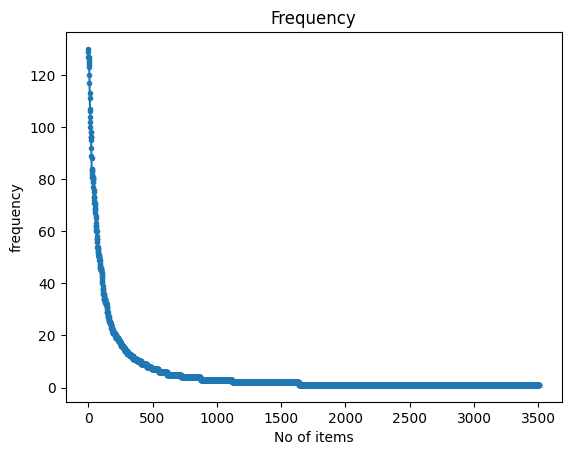

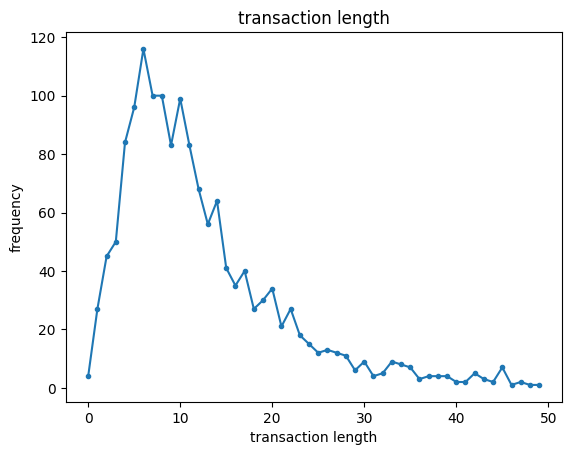

In [181]:
obj = tds.TransactionalDatabase(file_1)
obj.run()
obj.printStats()
obj.plotGraphs()

Database size (total no of transactions) : 1500
Number of items : 1081
Minimum Transaction Size : 1
Average Transaction Size : 13.158
Maximum Transaction Size : 54
Standard Deviation Transaction Size : 8.059261918232131
Variance in Transaction Sizes : 64.99503268845898
Sparsity : 0.9878279370952822


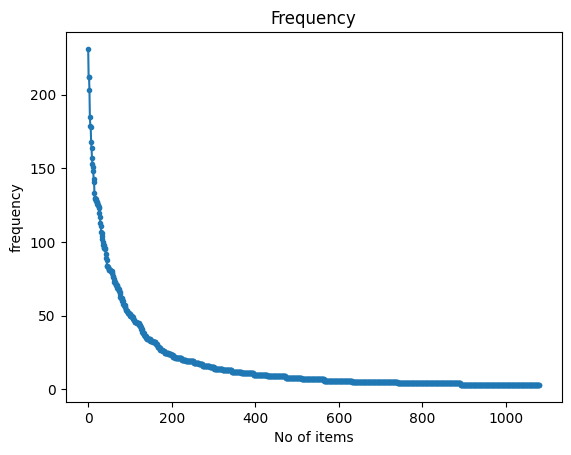

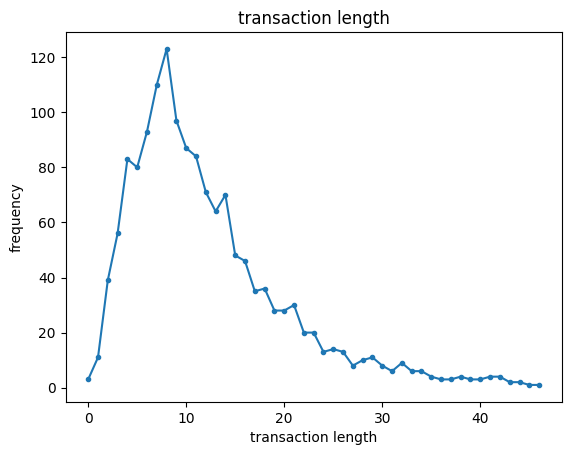

In [182]:
obj = tds.TransactionalDatabase(file_2)
obj.run()
obj.printStats()
obj.plotGraphs()

#### Find patterns by FPGrowth

In [183]:
MS_list        = np.linspace(3,12,4)

# iFile          = file_1
# suffix         = "filtered_by_tf_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)

iFile          = file_2
suffix         = "filtered_by_df_tf_remove_upper_bound_df=%.3f_remove_lower_bound_df=%.3f_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_df_freq, remove_lower_bound_df_freq, remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)

for MS in MS_list:
    print("Minimum support = %d"%(MS))
    oFile                            = "%s/frequency_patterns_FPGrowth_MinSup=%d_%s.txt"%(data_folder_all_labels, MS, suffix)
    obj                              = FPGrowth.FPGrowth(iFile=iFile, minSup=MS)
    obj.mine()
    obj.save(oFile)
    frequentPatternsDF_FPGrowth      = obj.getPatternsAsDataFrame().sort_values(by="Support", ascending=False)
    print('Total No of patterns: ' + str(len(frequentPatternsDF_FPGrowth))) #print the total number of patterns
    print('Runtime: ' + str(obj.getRuntime())) #measure the runtime
    print("-------------------------------------------------------------------------------------------")

Minimum support = 3
Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 42204
Runtime: 0.31630373001098633
-------------------------------------------------------------------------------------------
Minimum support = 6
Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 6263
Runtime: 0.10324788093566895
-------------------------------------------------------------------------------------------
Minimum support = 9
Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 2647
Runtime: 0.06317400932312012
-------------------------------------------------------------------------------------------
Minimum support = 12
Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 1478
Runtime: 0.04914593696594238
----------------------------------------------------------------------------------

#### Find patterns by FAE Top-K

In [184]:
K_list         = np.linspace(500, 1500, 3)

iFile          = file_1
suffix         = "filtered_by_tf_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)

# iFile          = file_2
# suffix         = "filtered_by_df_tf_remove_upper_bound_df=%.3f_remove_lower_bound_df=%.3f_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_df_freq, remove_lower_bound_df_freq, remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)

for K in K_list:
    print("K = %4d"%(K))
    oFile                            = "%s/frequency_patterns_FAE_topK_K=%d_%s.txt"%(data_folder_all_labels, K, suffix)
    obj                              = FAE.FAE(iFile=iFile, k=K)
    obj.mine()
    obj.save(oFile)
    frequentPatternsDF_FAE_topK = obj.getPatternsAsDataFrame().sort_values(by="Support", ascending=False)
    print('Total No of patterns: ' + str(len(frequentPatternsDF_FAE_topK))) #print the total number of patterns
    print('Runtime: ' + str(obj.getRuntime())) #measure the runtime
    print("-------------------------------------------------------------------------------------------")

K =  500
 TopK frequent patterns were successfully generated using FAE algorithm.
Total No of patterns: 500
Runtime: 0.10064005851745605
-------------------------------------------------------------------------------------------
K = 1000
 TopK frequent patterns were successfully generated using FAE algorithm.
Total No of patterns: 1000
Runtime: 0.3806185722351074
-------------------------------------------------------------------------------------------
K = 1500
 TopK frequent patterns were successfully generated using FAE algorithm.
Total No of patterns: 1500
Runtime: 1.1601474285125732
-------------------------------------------------------------------------------------------


#### Find patterns by MaxFPGrowth

In [185]:
MS_list        = np.linspace(3,12,4)
iFile          = file_1
suffix         = "filtered_by_tf_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)

# iFile          = file_2
# suffix         = "filtered_by_df_tf_remove_upper_bound_df=%.3f_remove_lower_bound_df=%.3f_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_df_freq, remove_lower_bound_df_freq, remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)

for MS in MS_list:
    print("Minimum support = %d"%(MS))
    oFile                            = "%s/frequency_patterns_MaxFPG_MinSup=%d_%s.txt"%(data_folder_all_labels, MS, suffix)
    obj                              = MaxFPGrowth.MaxFPGrowth(iFile=iFile, minSup=MS)
    obj.mine()
    obj.save(oFile)
    frequentPatternsDF_MaxFPGrowth   = obj.getPatternsAsDataFrame().sort_values(by="Support", ascending=False)
    print('Total No of patterns: ' + str(len(frequentPatternsDF_MaxFPGrowth))) #print the total number of patterns
    print('Runtime: ' + str(obj.getRuntime())) #measure the runtime
    print("-------------------------------------------------------------------------------------------")

Minimum support = 3
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 9262
Runtime: 0.38039183616638184
-------------------------------------------------------------------------------------------
Minimum support = 6
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 2370
Runtime: 0.054354190826416016
-------------------------------------------------------------------------------------------
Minimum support = 9
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 992
Runtime: 0.034905433654785156
-------------------------------------------------------------------------------------------
Minimum support = 12
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 488
Runtime: 0.02840900421142578
-----------------------------------------------------------------------------------

#### Use patterns found by **FPGrowth** to do prediction on **frequency-based** term-document matrix 

In [186]:
# Tokenize the sentences into sets of unique words
MS                                         = 6
suffix                                     = "filtered_by_tf_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)
# suffix                                     = "filtered_by_df_tf_remove_upper_bound_df=%.3f_remove_lower_bound_df=%.3f_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_df_freq, remove_lower_bound_df_freq, remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)
df["tokenized_comment"]                    = df["comment"].str.split().apply(set)
frequentPatternsDF_FPGrowth                = pd.read_csv("%s/frequency_patterns_FPGrowth_MinSup=%d_%s.txt"%(data_folder_all_labels, MS, suffix), delimiter=":", header=None, names=["Patterns", "Support"])
frequentPatternsDF_FPGrowth["Patterns"]    = frequentPatternsDF_FPGrowth["Patterns"].apply(lambda text: text.replace("\t", " "))

# Initialize the pattern matrix
final_pattern_df                           = frequentPatternsDF_FPGrowth
pattern_matrix                             = pd.DataFrame(0, index=df.index, columns=final_pattern_df["Patterns"])
tdm_df                                     = term_doc_matrix_by_frequency
# Create a mapping from numerical labels to category names
category_mapping                           = dict(df[["label", "sentiment"]].drop_duplicates().values)
# Convert the numerical category labels to text labels
target_names                               = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df["Patterns"]:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = df["tokenized_comment"].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)
augmented_df

,00,000,045,07,10,100,10m,11,11th,12,...,voice,voice from,voice can,not,not voice,not from,not can,can,can from,from
0,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,1,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1496,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1497,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
1498,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0


In [187]:
# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df, df["label"], test_size=0.3, random_state=seed)

# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.9066666666666666

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.9375    0.8824    0.9091       238
    nostalgia     0.8761    0.9340    0.9041       212

     accuracy                         0.9067       450
    macro avg     0.9068    0.9082    0.9066       450
 weighted avg     0.9086    0.9067    0.9067       450



In [188]:
cross_val_score(nb_classifier, augmented_df, df["label"], cv=10,scoring="accuracy").mean()

np.float64(0.8686666666666666)

#### Use patterns found by **FAE-TopK** to do prediction on **frequency-based** term-document matrix 

In [189]:
# Tokenize the sentences into sets of unique words
K                                       = 1500
suffix                                  = "filtered_by_tf_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)
# suffix                                  = "filtered_by_df_tf_remove_upper_bound_df=%.3f_remove_lower_bound_df=%.3f_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_df_freq, remove_lower_bound_df_freq, remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)
df["tokenized_comment"]                 = df["comment"].str.split().apply(set)
frequentPatternsDF_FAE_topK             = pd.read_csv("%s/frequency_patterns_FAE_topK_K=%d_%s.txt"%(data_folder_all_labels, K, suffix), delimiter=":", header=None, names=["Patterns", "Support"])
frequentPatternsDF_FAE_topK["Patterns"] = frequentPatternsDF_FAE_topK["Patterns"].apply(lambda text: text.replace("\t", " "))

# Initialize the pattern matrix
final_pattern_df                        = frequentPatternsDF_FAE_topK
pattern_matrix                          = pd.DataFrame(0, index=df.index, columns=final_pattern_df["Patterns"])
tdm_df                                  = term_doc_matrix_by_frequency
# Create a mapping from numerical labels to category names
category_mapping                        = dict(df[["label", "sentiment"]].drop_duplicates().values)
# Convert the numerical category labels to text labels
target_names                            = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df["Patterns"]:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = df["tokenized_comment"].apply(lambda x: 1 if pattern_words.issubset(x) else 0)


# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)
augmented_df

,00,000,045,07,10,100,10m,11,11th,12,...,don get,don anymore,thanks posting,used dad,singing after,school our,wish go,makes feel,too soon,rock roll
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1496,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1497,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1498,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [190]:
# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df, df["label"], test_size=0.3, random_state=seed)

# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8977777777777778

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.9404    0.8613    0.8991       238
    nostalgia     0.8578    0.9387    0.8964       212

     accuracy                         0.8978       450
    macro avg     0.8991    0.9000    0.8978       450
 weighted avg     0.9014    0.8978    0.8978       450



In [191]:
cross_val_score(nb_classifier, augmented_df, df["label"], cv=10,scoring="accuracy").mean()

np.float64(0.8646666666666667)

### Use patterns found by **MaxFPGrowth** to do prediction on **frequency-based** term-document matrix 

In [192]:
# Tokenize the sentences into sets of unique words
MS                                         = 9
suffix                                     = "filtered_by_tf_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)
# suffix                                     = "filtered_by_df_tf_remove_upper_bound_df=%.3f_remove_lower_bound_df=%.3f_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_df_freq, remove_lower_bound_df_freq, remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)
df["tokenized_comment"]                    = df["comment"].str.split().apply(set)
frequentPatternsDF_MaxFPGrowth             = pd.read_csv("%s/frequency_patterns_MaxFPG_MinSup=%d_%s.txt"%(data_folder_all_labels, MS, suffix), delimiter=":", header=None, names=["Patterns", "Support"])
frequentPatternsDF_MaxFPGrowth["Patterns"] = frequentPatternsDF_MaxFPGrowth["Patterns"].apply(lambda text: text.replace("\t", " "))

# Initialize the pattern matrix
final_pattern_df                           = frequentPatternsDF_MaxFPGrowth
pattern_matrix                             = pd.DataFrame(0, index=df.index, columns=final_pattern_df["Patterns"])
tdm_df                                     = term_doc_matrix_by_frequency
# Create a mapping from numerical labels to category names
category_mapping                           = dict(df[["label", "sentiment"]].drop_duplicates().values)
# Convert the numerical category labels to text labels
target_names                               = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df["Patterns"]:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = df["tokenized_comment"].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)
augmented_df

,00,000,045,07,10,100,10m,11,11th,12,...,from now,can remember,from remember,voice remember,voice not,from not,can not,from voice,can voice,from can
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1496,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1497,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1498,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [193]:
# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df, df["label"], test_size=0.3, random_state=seed)

# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.9

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.9406    0.8655    0.9015       238
    nostalgia     0.8615    0.9387    0.8984       212

     accuracy                         0.9000       450
    macro avg     0.9011    0.9021    0.9000       450
 weighted avg     0.9033    0.9000    0.9001       450



In [194]:
cross_val_score(nb_classifier, augmented_df, df["label"], cv=10,scoring="accuracy").mean()

np.float64(0.8713333333333333)

In [70]:
from sklearn.feature_extraction.text import TfidfVectorizer
corpus = [
    'This This This is the first document.',
    'This document is the second document.',
    'And this is the third one.',
    'Is this the first document?',
]
vectorizer = TfidfVectorizer(norm=None)
X = vectorizer.fit_transform(df["comment"])
vectorizer.get_feature_names_out()

array(['00', '000', '045', ..., 'yup', 'zealand', 'zulus'], dtype=object)

In [74]:
np.argmax(X.toarray().sum(axis=0))
vectorizer.get_feature_names_out()[3284]

'the'

In [75]:
np.log10(np.argmax(X.toarray().sum(axis=0)))

np.float64(3.516403148447403)

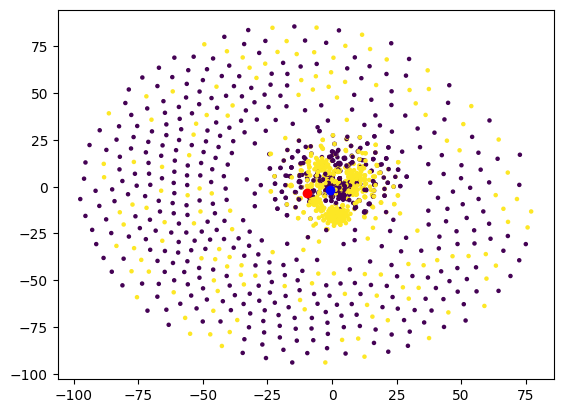

In [205]:
'''
remove_upper_bound_df_tfidf      = 0.50 # removed by document frequency (percentage); only remove terms by document frequency when vectorizing
remove_lower_bound_df_tfidf      = 0.10 # removed by document frequency (percentage); only remove terms by document frequency when vectorizing
remove_upper_bound_sorting_tfidf = 1.00 # removed by term frequency/tf-idf (percentage); remove indices by term frequency after sorting by term frequency/tf-idf
remove_lower_bound_sorting_tfidf = 0.00 # removed by term frequency/tf-idf (percentage); remove indices by term frequency after sorting by term frequency/tf-idf
 
# term_doc_matrix_by_tfidf_filtered_by_tfidf, idx_token_sorted_by_tfidf_filtered_by_tfidf, tfidf_vect_fitered_by_tfidf = \
#     make_term_document_matrix(df, method="tf-idf", remove_flag_by_df=False,     remove_flag_by_sorting=True,
#                                 remove_upper_bound_tf=remove_upper_bound_sorting_tfidf, remove_lower_bound_tf=remove_lower_bound_sorting_tfidf)

term_doc_matrix_by_tfidf_filtered_by_df_tfidf, idx_token_sorted_by_tfidf_filtered_by_df_tfidf, tfidf_vect_filtered_by_df_tfidf = \
    make_term_document_matrix(df, method="tf-idf", remove_flag_by_df=True,   remove_flag_by_sorting=True,\
                                remove_upper_bound_df=remove_upper_bound_df_tfidf,      remove_lower_bound_df=remove_lower_bound_df_tfidf,\
                                remove_upper_bound_tf=remove_upper_bound_sorting_tfidf, remove_lower_bound_tf=remove_lower_bound_sorting_tfidf)

'''

tdm_df                                  = pattern_matrix

# Do L2 normlization 
# normalization                           = np.sqrt((tdm_df**2.0).sum(axis=1)+1e-34)
# tdm_df                                  = tdm_df.div(normalization, axis=0)

tdm_df_tsne       = TSNE(n_components=2).fit_transform(tdm_df)
tdm_df_tsne_label = df["label"]

vector_mean_0     = np.mean(tdm_df_tsne[tdm_df_tsne_label==0],axis=0)
vector_mean_1     = np.mean(tdm_df_tsne[tdm_df_tsne_label==1],axis=0)

# vector_mean_0     = np.median(tdm_df_tsne[tdm_df_tsne_label==0],axis=0)
# vector_mean_1     = np.median(tdm_df_tsne[tdm_df_tsne_label==1],axis=0)

distance_0        = np.sqrt(((tdm_df_tsne - vector_mean_0)**2.0).sum(axis=1))
distance_1        = np.sqrt(((tdm_df_tsne - vector_mean_1)**2.0).sum(axis=1))
distance_label    = np.ones(df.shape[0], dtype=int)
distance_label[distance_0 < distance_1] = 0
df["distance label"] = distance_label

plt.scatter(tdm_df_tsne[:,0], tdm_df_tsne[:,1], c=tdm_df_tsne_label, s=5.0)
plt.scatter(vector_mean_0[0], vector_mean_0[1], c='red')
plt.scatter(vector_mean_1[0], vector_mean_1[1], c='blue')



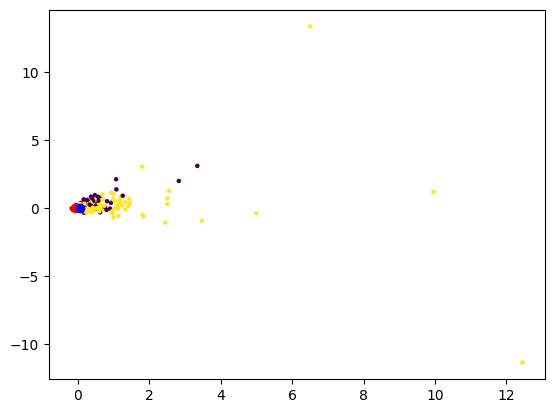

In [129]:
tdm_df_pca       = PCA(n_components=2).fit_transform(tdm_df)
tdm_df_pca_label = df["label"]

vector_mean_0     = np.mean(tdm_df_pca[tdm_df_tsne_label==0],axis=0)
vector_mean_1     = np.mean(tdm_df_pca[tdm_df_tsne_label==1],axis=0)

# vector_mean_0     = np.median(tdm_df_pca[tdm_df_tsne_label==0],axis=0)
# vector_mean_1     = np.median(tdm_df_pca[tdm_df_tsne_label==1],axis=0)

plt.scatter(tdm_df_pca[:,0], tdm_df_pca[:,1], c=tdm_df_tsne_label, s=5.0)
plt.scatter(vector_mean_0[0], vector_mean_0[1], c='red')
plt.scatter(vector_mean_1[0], vector_mean_1[1], c='blue')

In [110]:
pattern_matrix.shape

(1500, 450)

In [108]:
MS                                         = 12

# suffix                                     = "filtered_by_tf_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)
suffix                                     = "filtered_by_df_tf_remove_upper_bound_df=%.3f_remove_lower_bound_df=%.3f_remove_upper_bound_sorting=%.3f_remove_lower_bound_sorting=%.3f"%(remove_upper_bound_df_freq, remove_lower_bound_df_freq, remove_upper_bound_sorting_freq, remove_lower_bound_sorting_freq)
df["tokenized_comment"]                    = df["comment"].str.split().apply(set)
frequentPatternsDF_MaxFPGrowth             = {}

for label in label_list:
    data_folder_label                      = "./transcation_database_HW1_%s"%(label)
    frequentPatternsDF_MaxFPGrowth[label]  = pd.read_csv("%s/frequency_patterns_MaxFPG_MinSup=%d_%s.txt"%(data_folder_label, MS, suffix), delimiter=":", header=None, names=["Patterns", "Support"])
    frequentPatternsDF_MaxFPGrowth[label]["Patterns"] = frequentPatternsDF_MaxFPGrowth[label]["Patterns"].apply(lambda text: text.replace("\t", " "))

# Initialize the pattern matrix
final_pattern_df                           = pd.concat((frequentPatternsDF_MaxFPGrowth["nostalgia"].set_index(["Patterns"]),\
                                                        frequentPatternsDF_MaxFPGrowth["not nostalgia"].set_index(["Patterns"])), ignore_index=True, axis=1).fillna(0).astype(int)
final_pattern_df.columns                   = label_list
unique_filter                              = (final_pattern_df["nostalgia"] == 0) | (final_pattern_df["not nostalgia"] == 0) 
pattern_matrix                             = pd.DataFrame(0, index=df.index, columns=final_pattern_df.index[unique_filter])

# Create a mapping from numerical labels to category names
category_mapping                           = dict(df[["label", "sentiment"]].drop_duplicates().values)
# Convert the numerical category labels to text labels
target_names                               = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df.index[unique_filter].values:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = df["tokenized_comment"].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

In [115]:
augmented_df = pd.concat([pattern_matrix], axis=1)

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df, df["label"], test_size=0.3, random_state=seed)
# X_train, X_test, y_train, y_test = train_test_split(tdm_df, df["label"], test_size=0.3, random_state=seed)

# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.7533333333333333

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.8290    0.6723    0.7425       238
    nostalgia     0.6965    0.8443    0.7633       212

     accuracy                         0.7533       450
    macro avg     0.7628    0.7583    0.7529       450
 weighted avg     0.7666    0.7533    0.7523       450



In [113]:
category_mapping
target_names


['not nostalgia', 'nostalgia']

In [39]:
from sklearn.datasets import make_classification

nb_samples = 300
X, Y = make_classification(n_samples=nb_samples, n_features=2, n_informative=2, n_redundant=0)

from sklearn.naive_bayes import BernoulliNB
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.25)

bnb = BernoulliNB(binarize=0.0)
bnb.fit(X_train, Y_train)
bnb.score(X_test, Y_test)

0.8533333333333334

In [40]:
data = np.array([[0, 0], [0, 1], [1, 0], [1, 1]])
bnb.predict(data)

array([0, 1, 0, 1])

In [42]:
X[0].shape

(2,)

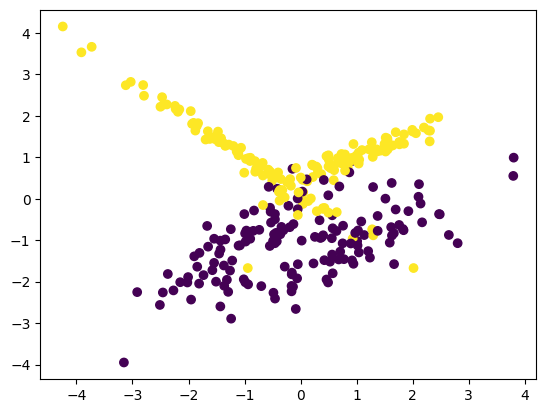

In [44]:
plt.scatter(X[:,0], X[:,1], c=Y)